#### Importing libraries

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
## Reading the csv files and find basic features
df=pd.read_csv('netflix.csv')
df.head(10)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...
5,s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, H...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",The arrival of a charismatic young priest brin...
6,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ...",NaN,"September 24, 2021",2021,PG,91 min,Children & Family Movies,Equestria's divided. But a bright-eyed hero be...
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...","United States, Ghana, Burkina Faso, United Kin...","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s..."
8,s9,TV Show,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Ho...",United Kingdom,"September 24, 2021",2021,TV-14,9 Seasons,"British TV Shows, Reality TV",A talented batch of amateur bakers face off in...
9,s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, T...",United States,"September 24, 2021",2021,PG-13,104 min,"Comedies, Dramas",A woman adjusting to life after a loss contend...


In [3]:
#finding basic features 
df.shape

(8807, 12)

In [4]:
#Checking type of data
df.dtypes

show_id         object
type            object
title           object
director        object
cast            object
country         object
date_added      object
release_year     int64
rating          object
duration        object
listed_in       object
description     object
dtype: object

In [5]:
## Number of different values in different columns of the data
df.iloc[::,::].nunique()

show_id         8807
type               2
title           8807
director        4528
cast            7692
country          748
date_added      1767
release_year      74
rating            17
duration         220
listed_in        514
description     8775
dtype: int64

In [6]:
## Checking null values in every column
df.isnull().sum()

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

In [7]:
## checking value caounts of the column with int dtype i.e Rating other columns have csv therefore it will not give correct result
df['rating'].value_counts()

TV-MA       3207
TV-14       2160
TV-PG        863
R            799
PG-13        490
TV-Y7        334
TV-Y         307
PG           287
TV-G         220
NR            80
G             41
TV-Y7-FV       6
NC-17          3
UR             3
74 min         1
84 min         1
66 min         1
Name: rating, dtype: int64

## Unesting the column with csv in it

#### explode()
If the data in the column is a list or an array, you can use the explode() function to transform each element in the list into a separate row.

In [8]:
# Unesting the director column using explode method which is used for unesting lists present in column into single rows for individual value

dir_list = df['director'].apply(lambda x:str(x).split(', '))
df_director = pd.DataFrame({'title':df['title'],'director':dir_list})
df_director = df_director.explode('director')
df_director

,title,director
0,Dick Johnson Is Dead,Kirsten Johnson
1,Blood & Water,nan
2,Ganglands,Julien Leclercq
3,Jailbirds New Orleans,nan
4,Kota Factory,nan
...,...,...
8802,Zodiac,David Fincher
8803,Zombie Dumb,nan
8804,Zombieland,Ruben Fleischer
8805,Zoom,Peter Hewitt


In [9]:
#Unesting cast column and creating seperate row for each cast for specific movie

cast_list = df['cast'].apply(lambda x:str(x).split(', '))
df_cast = pd.DataFrame({'title':df['title'],'cast':cast_list})
df_cast = df_cast.explode('cast')
df_cast

,title,cast
0,Dick Johnson Is Dead,nan
1,Blood & Water,Ama Qamata
1,Blood & Water,Khosi Ngema
1,Blood & Water,Gail Mabalane
1,Blood & Water,Thabang Molaba
...,...,...
8806,Zubaan,Manish Chaudhary
8806,Zubaan,Meghna Malik
8806,Zubaan,Malkeet Rauni
8806,Zubaan,Anita Shabdish


In [10]:
## Unesting the genre column into individual rows

genre_list = df['listed_in'].apply(lambda x:str(x).split(', '))
df_genre = pd.DataFrame({'title':df['title'],'genre':genre_list})
df_genre = df_genre.explode('genre')
df_genre

,title,genre
0,Dick Johnson Is Dead,Documentaries
1,Blood & Water,International TV Shows
1,Blood & Water,TV Dramas
1,Blood & Water,TV Mysteries
2,Ganglands,Crime TV Shows
...,...,...
8805,Zoom,Children & Family Movies
8805,Zoom,Comedies
8806,Zubaan,Dramas
8806,Zubaan,International Movies


In [11]:
## Unesting country column into individual rows


country_list = df['country'].apply(lambda x:str(x).split(', '))
df_country = pd.DataFrame({'title':df['title'],'country':country_list})
df_country = df_country.explode('country')
df_country

,title,country
0,Dick Johnson Is Dead,United States
1,Blood & Water,South Africa
2,Ganglands,nan
3,Jailbirds New Orleans,nan
4,Kota Factory,India
...,...,...
8802,Zodiac,United States
8803,Zombie Dumb,nan
8804,Zombieland,United States
8805,Zoom,United States


In [12]:
## Merging the director with cast
df_cd = df_director.merge(df_cast,on = ['title'])
df_cd.head()

,title,director,cast
0,Dick Johnson Is Dead,Kirsten Johnson,nan
1,Blood & Water,nan,Ama Qamata
2,Blood & Water,nan,Khosi Ngema
3,Blood & Water,nan,Gail Mabalane
4,Blood & Water,nan,Thabang Molaba


In [13]:
## Merging country with genre
df_gc = df_country.merge(df_genre,on=['title'])
df_gc.head()

,title,country,genre
0,Dick Johnson Is Dead,United States,Documentaries
1,Blood & Water,South Africa,International TV Shows
2,Blood & Water,South Africa,TV Dramas
3,Blood & Water,South Africa,TV Mysteries
4,Ganglands,nan,Crime TV Shows


In [14]:
## geting the final Data Frame after merging all 
df_mer = df_cd.merge(df_gc,on='title')
df_mer

,title,director,cast,country,genre
0,Dick Johnson Is Dead,Kirsten Johnson,nan,United States,Documentaries
1,Blood & Water,nan,Ama Qamata,South Africa,International TV Shows
2,Blood & Water,nan,Ama Qamata,South Africa,TV Dramas
3,Blood & Water,nan,Ama Qamata,South Africa,TV Mysteries
4,Blood & Water,nan,Khosi Ngema,South Africa,International TV Shows
...,...,...,...,...,...
201986,Zubaan,Mozez Singh,Anita Shabdish,India,International Movies
201987,Zubaan,Mozez Singh,Anita Shabdish,India,Music & Musicals
201988,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,Dramas
201989,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,International Movies


In [15]:
# Merging the unested data Frame with the orignal data frame
df_final = df_mer.merge(df[['show_id', 'type', 'title', 'date_added','release_year', 'rating', 'duration']],
                       on='title',how = 'left')
df_final

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration
0,Dick Johnson Is Dead,Kirsten Johnson,nan,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,90 min
1,Blood & Water,nan,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
2,Blood & Water,nan,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
3,Blood & Water,nan,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
4,Blood & Water,nan,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
...,...,...,...,...,...,...,...,...,...,...,...
201986,Zubaan,Mozez Singh,Anita Shabdish,India,International Movies,s8807,Movie,"March 2, 2019",2015,TV-14,111 min
201987,Zubaan,Mozez Singh,Anita Shabdish,India,Music & Musicals,s8807,Movie,"March 2, 2019",2015,TV-14,111 min
201988,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,Dramas,s8807,Movie,"March 2, 2019",2015,TV-14,111 min
201989,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,International Movies,s8807,Movie,"March 2, 2019",2015,TV-14,111 min


## Checking null values in the unested DataFrame

In [16]:
df_final.isnull().sum()

title             0
director          0
cast              0
country           0
genre             0
show_id           0
type              0
date_added      158
release_year      0
rating           67
duration          3
dtype: int64

In [17]:
# updating nan values of director with unkown_director and likewise other columns also

df_final.loc[df_final['director']=='nan','director'] = 'unkown_director'
df_final.loc[df_final['cast']=='nan','cast']='unkown_cast'
df_final.loc[df_final['genre']=='nan','genre']='unkown_genre'

In [18]:
for i in ['director','cast','country','genre']:
    print(df_final[i].value_counts(),'\n')

unkown_director        50643
Martin Scorsese          419
Youssef Chahine          409
Cathy Garcia-Molina      356
Steven Spielberg         355
                       ...  
Richard Maurice            1
Richard E. Norman          1
Spencer Williams           1
Oscar Micheaux             1
Kirsten Johnson            1
Name: director, Length: 4994, dtype: int64 

unkown_cast       2146
Liam Neeson        161
Alfred Molina      160
John Krasinski     139
Salma Hayek        130
                  ... 
Dario Yazbek         1
Corinne Foxx         1
Jacob Craner         1
Laila Berzins        1
Richard Ryan         1
Name: cast, Length: 36440, dtype: int64 

United States     59349
India             22814
United Kingdom    12945
nan               11897
Japan              8679
                  ...  
Palestine             2
Kazakhstan            1
Nicaragua             1
United States,        1
Uganda                1
Name: country, Length: 128, dtype: int64 

Dramas                          29

#### In duration column, it was observed that the nulls had values which were written in corresponding ratings column, i.e- you can't expect ratings to be in min. So the duration column nulls are replaced by corresponding values in ratings column

In [19]:
df['rating'].value_counts()

TV-MA       3207
TV-14       2160
TV-PG        863
R            799
PG-13        490
TV-Y7        334
TV-Y         307
PG           287
TV-G         220
NR            80
G             41
TV-Y7-FV       6
NC-17          3
UR             3
74 min         1
84 min         1
66 min         1
Name: rating, dtype: int64

In [20]:
df_final['duration'].value_counts().head(60)

1 Season     35035
2 Seasons     9559
3 Seasons     5084
94 min        4343
106 min       4040
97 min        3624
95 min        3560
96 min        3484
93 min        3480
90 min        3305
105 min       3209
107 min       3103
101 min       3048
102 min       3017
103 min       2985
98 min        2984
99 min        2956
91 min        2915
92 min        2863
104 min       2822
88 min        2781
110 min       2711
100 min       2697
108 min       2614
112 min       2594
85 min        2486
89 min        2420
86 min        2213
4 Seasons     2134
116 min       2122
118 min       2119
119 min       2075
87 min        2063
109 min       2020
113 min       1990
120 min       1845
117 min       1770
121 min       1728
5 Seasons     1698
111 min       1667
124 min       1590
114 min       1529
127 min       1505
115 min       1444
123 min       1398
125 min       1299
122 min       1298
84 min        1267
128 min       1241
130 min       1216
126 min       1205
81 min        1203
83 min      

In [21]:
df_final.loc[df_final['duration'].isnull(),'duration'] = df_final.loc[df_final['duration'].isnull(),'duration'].fillna(df_final['rating'])
df_final.isnull().sum()

title             0
director          0
cast              0
country           0
genre             0
show_id           0
type              0
date_added      158
release_year      0
rating           67
duration          0
dtype: int64

##### The rating column values and min rows should be replaced with unknown_rating 

In [22]:
df_final.loc[df_final['rating'].str.contains('min',na=False),'rating']='unknown_rating'
df_final['rating'].fillna('unknown_rating',inplace=True)
df_final.loc[df_final['rating']=='unknown_rating']

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration
126537,Louis C.K. 2017,Louis C.K.,Louis C.K.,United States,Movies,s5542,Movie,"April 4, 2017",2017,unknown_rating,74 min
131603,Louis C.K.: Hilarious,Louis C.K.,Louis C.K.,United States,Movies,s5795,Movie,"September 16, 2016",2010,unknown_rating,84 min
131737,Louis C.K.: Live at the Comedy Store,Louis C.K.,Louis C.K.,United States,Movies,s5814,Movie,"August 15, 2016",2015,unknown_rating,66 min
135125,13TH: A Conversation with Oprah Winfrey & Ava ...,unkown_director,Oprah Winfrey,nan,Movies,s5990,Movie,"January 26, 2017",2017,unknown_rating,37 min
135126,13TH: A Conversation with Oprah Winfrey & Ava ...,unkown_director,Ava DuVernay,nan,Movies,s5990,Movie,"January 26, 2017",2017,unknown_rating,37 min
...,...,...,...,...,...,...,...,...,...,...,...
171942,My Honor Was Loyalty,Alessandro Pepe,Francesco Migliore,Italy,Dramas,s7538,Movie,"March 1, 2017",2015,unknown_rating,115 min
171943,My Honor Was Loyalty,Alessandro Pepe,Albrecht Weimer,Italy,Dramas,s7538,Movie,"March 1, 2017",2015,unknown_rating,115 min
171944,My Honor Was Loyalty,Alessandro Pepe,Giulia Dichiaro,Italy,Dramas,s7538,Movie,"March 1, 2017",2015,unknown_rating,115 min
171945,My Honor Was Loyalty,Alessandro Pepe,Alessandra Oriti Niosi,Italy,Dramas,s7538,Movie,"March 1, 2017",2015,unknown_rating,115 min


#### Checking nulls in date_added column

In [23]:
# The nulls in date added column can be filled using imputation method
df_final[df_final['date_added'].isnull()].head(60)

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration
136893,A Young Doctor's Notebook and Other Stories,unkown_director,Daniel Radcliffe,United Kingdom,British TV Shows,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136894,A Young Doctor's Notebook and Other Stories,unkown_director,Daniel Radcliffe,United Kingdom,TV Comedies,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136895,A Young Doctor's Notebook and Other Stories,unkown_director,Daniel Radcliffe,United Kingdom,TV Dramas,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136896,A Young Doctor's Notebook and Other Stories,unkown_director,Jon Hamm,United Kingdom,British TV Shows,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136897,A Young Doctor's Notebook and Other Stories,unkown_director,Jon Hamm,United Kingdom,TV Comedies,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136898,A Young Doctor's Notebook and Other Stories,unkown_director,Jon Hamm,United Kingdom,TV Dramas,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136899,A Young Doctor's Notebook and Other Stories,unkown_director,Adam Godley,United Kingdom,British TV Shows,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136900,A Young Doctor's Notebook and Other Stories,unkown_director,Adam Godley,United Kingdom,TV Comedies,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136901,A Young Doctor's Notebook and Other Stories,unkown_director,Adam Godley,United Kingdom,TV Dramas,s6067,TV Show,NaN,2013,TV-MA,2 Seasons
136902,A Young Doctor's Notebook and Other Stories,unkown_director,Christopher Godwin,United Kingdom,British TV Shows,s6067,TV Show,NaN,2013,TV-MA,2 Seasons


### Filling missing Values by imputation

#### Mode Imputation for date added column

In [24]:
## Filling Values by mode imputation.

# Date added column is imputed on the basis of release year,i.e- suppose there's a null for date_added
# When release year was 2013.So below piece of code just checks the mode of date added for release year=2013 
# and imputes in place of nulls the corresponding mode

for i in df_final[df_final['date_added'].isnull()]['release_year'].unique():
    mode_imp = df_final[df_final['release_year']==i]['date_added'].mode().values[0]
    df_final.loc[df_final['release_year']==i,'date_added'] = df_final.loc[df_final['release_year']==i,'date_added'].fillna(mode_imp)

#### Mode imputation for country column

In [25]:
# Country column is imputed on the basis of director,i.e- suppose there's a null for country
# when we have a director whose other movies have a country given.So below piece of code just checks the mode of
# Country for the director and imputes in place of nulls the corresponding mode

df_final.loc[df_final['country']=='unkown_country','country']=np.NaN
for i in df_final[df_final['country'].isnull()]['director'].unique():
    if i in df_final[~df_final['country'].isnull()]['director'].unique():
        mode_imp = df_final[df_final['director']==i]['country'].mode().values[0]
        df_final.loc[df_final['director']==i,'country'] = df_final.loc[df_final['director']==i,'country'].fillna(mode_imp)


In [26]:
## More than 50 percent of values are imputed through mode imputation these values are left
df_final['country'].isnull().sum()

0

In [27]:
# So we imputed the country column on the basis of directors whose other movie titles had countries given. 
# But there might be directors who have only one occurence in our data. 
# In that scenario, we can use Cast as a basis. i.e- for this Cast or Actor majorly acts in movies of which country? 
# Imputation has been done on this basis. For remaining rows, country has been filled as Unknown Country

for i in df_final[df_final['country'].isnull()]['cast'].unique():
    if i in df_final[~df_final['country'].isnull()]['cast'].unique():
        mode_imp = df_final[df_final['cast']==i]['country'].mode().values[0]
        df_final.loc[df_final['cast']==i,'country'] = df_final.loc[df_final['cast']==i,'country'].fillna(mode_imp)

## These are the remaining Values which are null
df_final['country'].isnull().sum()

0

In [28]:
# Filling the remaining values of country with unkown_country
df_final['country'].fillna('unkown_country',inplace=True)

### After Handling Missing Values lets check the nulls in df

In [29]:
# All nulls have been removed with appropriate methods
df_final.isnull().sum()

title           0
director        0
cast            0
country         0
genre           0
show_id         0
type            0
date_added      0
release_year    0
rating          0
duration        0
dtype: int64

In [30]:
df_final.head(10)

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,90 min
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
5,Blood & Water,unkown_director,Khosi Ngema,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
6,Blood & Water,unkown_director,Khosi Ngema,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
7,Blood & Water,unkown_director,Gail Mabalane,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
8,Blood & Water,unkown_director,Gail Mabalane,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
9,Blood & Water,unkown_director,Gail Mabalane,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons


## Analyzing duration

In [31]:
df_final['duration']

0            90 min
1         2 Seasons
2         2 Seasons
3         2 Seasons
4         2 Seasons
            ...    
201986      111 min
201987      111 min
201988      111 min
201989      111 min
201990      111 min
Name: duration, Length: 201991, dtype: object

In [32]:
df_final['duration'] = df_final['duration'].str.replace(" min","")
df_final['duration']

0                90
1         2 Seasons
2         2 Seasons
3         2 Seasons
4         2 Seasons
            ...    
201986          111
201987          111
201988          111
201989          111
201990          111
Name: duration, Length: 201991, dtype: object

In [33]:
df_final['duration'].unique()

array(['90', '2 Seasons', '1 Season', '91', '125', '9 Seasons', '104',
       '127', '4 Seasons', '67', '94', '5 Seasons', '161', '61', '166',
       '147', '103', '97', '106', '111', '3 Seasons', '110', '105', '96',
       '124', '116', '98', '23', '115', '122', '99', '88', '100',
       '6 Seasons', '102', '93', '95', '85', '83', '113', '13', '182',
       '48', '145', '87', '92', '80', '117', '128', '119', '143', '114',
       '118', '108', '63', '121', '142', '154', '120', '82', '109', '101',
       '86', '229', '76', '89', '156', '112', '107', '129', '135', '136',
       '165', '150', '133', '70', '84', '140', '78', '7 Seasons', '64',
       '59', '139', '69', '148', '189', '141', '130', '138', '81', '132',
       '10 Seasons', '123', '65', '68', '66', '62', '74', '131', '39',
       '46', '38', '8 Seasons', '17 Seasons', '126', '155', '159', '137',
       '12', '273', '36', '34', '77', '60', '49', '58', '72', '204',
       '212', '25', '73', '29', '47', '32', '35', '71', '149', '

In [34]:
## Converting the duration value for season to 0 by creating a new data frame for analysis

df_final1 = df_final.copy()
df_final1['duration_copy'] = df_final1['duration']
df_final1

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,duration_copy
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,90,90
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2 Seasons
...,...,...,...,...,...,...,...,...,...,...,...,...
201986,Zubaan,Mozez Singh,Anita Shabdish,India,International Movies,s8807,Movie,"March 2, 2019",2015,TV-14,111,111
201987,Zubaan,Mozez Singh,Anita Shabdish,India,Music & Musicals,s8807,Movie,"March 2, 2019",2015,TV-14,111,111
201988,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,Dramas,s8807,Movie,"March 2, 2019",2015,TV-14,111,111
201989,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,International Movies,s8807,Movie,"March 2, 2019",2015,TV-14,111,111


In [35]:
df_final1.loc[df_final1['duration_copy'].str.contains('Season'),'duration_copy'] = 0
df_final1['duration_copy'] = df_final1['duration_copy'].astype('int')
df_final1

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,duration_copy
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,90,90
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,0
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,0
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,0
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,0
...,...,...,...,...,...,...,...,...,...,...,...,...
201986,Zubaan,Mozez Singh,Anita Shabdish,India,International Movies,s8807,Movie,"March 2, 2019",2015,TV-14,111,111
201987,Zubaan,Mozez Singh,Anita Shabdish,India,Music & Musicals,s8807,Movie,"March 2, 2019",2015,TV-14,111,111
201988,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,Dramas,s8807,Movie,"March 2, 2019",2015,TV-14,111,111
201989,Zubaan,Mozez Singh,Chittaranjan Tripathy,India,International Movies,s8807,Movie,"March 2, 2019",2015,TV-14,111,111


In [36]:
df_final1['duration_copy'].describe()

count    201991.000000
mean         77.152789
std          52.269154
min           0.000000
25%           0.000000
50%          95.000000
75%         112.000000
max         312.000000
Name: duration_copy, dtype: float64

C:\Users\tsvis\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


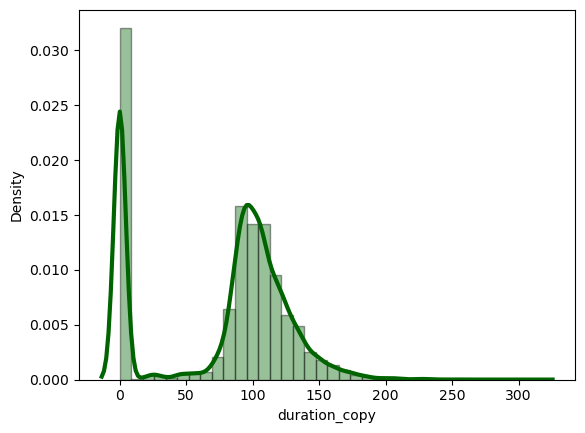

In [37]:
sns.distplot(df_final1['duration_copy'], hist=True, kde=True,
bins=int(36), color = 'darkgreen',
hist_kws={'edgecolor':'black'},
kde_kws={'linewidth': 3})
plt.show()

In [38]:
bins1 = [-1,1,50,80,100,120,150,200,315]
labels1 = ['<1','1-50','50-80','80-100','100-120','120-150','150-200','200-315']
df_final1['duration_copy'] = pd.cut(df_final1['duration_copy'],bins=bins1,labels=labels1)
df_final1.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,duration_copy
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,90,80-100
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,<1
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,<1
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,<1
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,<1


In [39]:
df_final1.loc[~df_final1['duration'].str.contains('Season'),'duration']=df_final1.loc[~df_final1['duration'].str.contains('Season'),'duration_copy']
df_final1.drop(['duration_copy'],axis=1,inplace=True)
df_final1.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,80-100
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons


In [40]:
df_final1['duration'].value_counts()

80-100        52937
100-120       48724
1 Season      35035
120-150       26691
2 Seasons      9559
50-80          7700
150-200        6737
3 Seasons      5084
1-50           2530
4 Seasons      2134
5 Seasons      1698
7 Seasons       843
6 Seasons       633
200-315         524
8 Seasons       286
9 Seasons       257
10 Seasons      220
13 Seasons      132
12 Seasons      111
15 Seasons       96
17 Seasons       30
11 Seasons       30
Name: duration, dtype: int64

In [41]:
from datetime import datetime
from dateutil.parser import parse
arr=[]
for i in df_final1['date_added'].values:
  dt1=parse(i)
  arr.append(dt1.strftime('%Y-%m-%d'))
df_final1['Modified_Added_date'] =arr
df_final1['Modified_Added_date']=pd.to_datetime(df_final1['Modified_Added_date'])
df_final1['month_added']=df_final1['Modified_Added_date'].dt.month
df_final1['week_Added']=df_final1['Modified_Added_date'].dt.week
df_final1['year']=df_final1['Modified_Added_date'].dt.year
df_final1.head()

C:\Users\tsvis\AppData\Local\Temp\ipykernel_13240\917954583.py:10: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df_final1['week_Added']=df_final1['Modified_Added_date'].dt.week


,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,80-100,2021-09-25,9,38,2021
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021


In [42]:
#Titles such as Bahubali(Hindi Version),Bahubali(Tamil Version) were there. Since it's only one movie in different languages,
#presence of brackets and content between brackets is removed.
df_final1['title']=df_final1['title'].str.replace(r"\(.*\)","")
df_final1.head()

C:\Users\tsvis\AppData\Local\Temp\ipykernel_13240\3753997727.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  df_final1['title']=df_final1['title'].str.replace(r"\(.*\)","")


,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,80-100,2021-09-25,9,38,2021
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021


## Univariate Analysis in terms of counts of each column

In [43]:
#number of distinct titles on the basis of genre
df_final1.groupby(['genre']).agg({"title":"nunique"})

,title
genre,
Action & Adventure,854
Anime Features,71
Anime Series,176
British TV Shows,253
Children & Family Movies,639
Classic & Cult TV,28
Classic Movies,116
Comedies,1673
Crime TV Shows,470


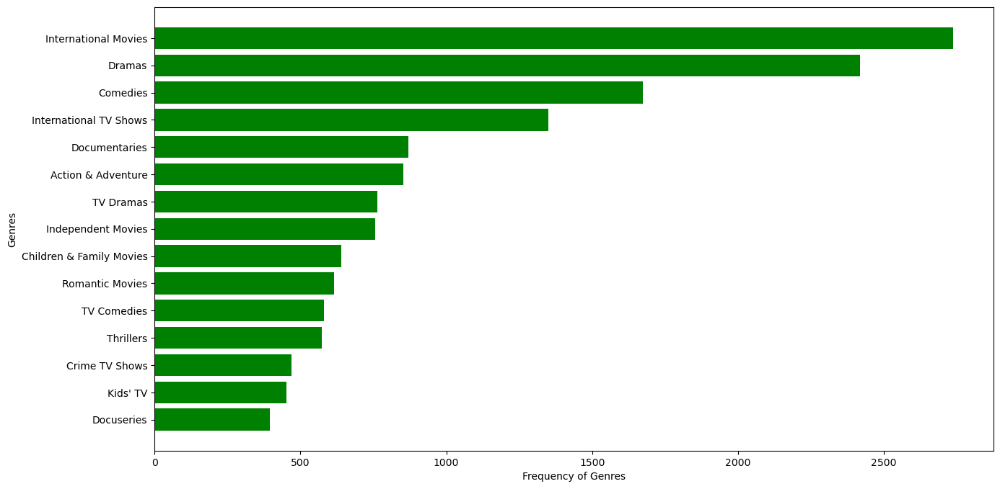

In [44]:
df_genre=df_final1.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['green'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

#### International Movies, Dramas and Comedies are the most popular .

In [45]:
#number of distinct titles on the basis of type
df_final1.groupby(['type']).agg({"title":"nunique"})

,title
type,
Movie,6115
TV Show,2676


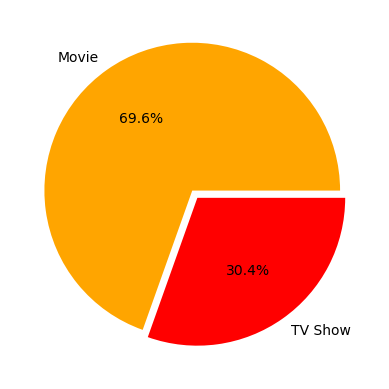

In [46]:
df_type=df_final1.groupby(['type']).agg({"title":"nunique"}).reset_index()
plt.pie(df_type['title'],explode=(0.03,0.03), labels=df_type['type'],colors=['orange','red'],autopct='%.1f%%')
plt.show()

#### We have 70:30 ratio of Movies and TV Shows in our data

In [47]:
pd.set_option('display.max_rows',None)

In [48]:
#number of distinct titles on the basis of country
df_final1.groupby(['country']).agg({"title":"nunique"})

,title
country,
,2
Afghanistan,1
Albania,1
Algeria,3
Angola,1
Argentina,91
Armenia,1
Australia,160
Austria,12


The above dataframe shows a flaw in which we are seeing countries, such as Cambodia and Cambodia, or United States and United States, are shown as different countries.They should have been same

In [49]:
df_final1['country'] = df_final1['country'].str.replace(',', '')
df_final1.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,80-100,2021-09-25,9,38,2021
1,Blood & Water,unkown_director,Ama Qamata,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
2,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Dramas,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
3,Blood & Water,unkown_director,Ama Qamata,South Africa,TV Mysteries,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021
4,Blood & Water,unkown_director,Khosi Ngema,South Africa,International TV Shows,s2,TV Show,"September 24, 2021",2021,TV-MA,2 Seasons,2021-09-24,9,38,2021


In [50]:
#number of distinct titles on the basis of country
df_final1.groupby(['country']).agg({"title":"nunique"})

,title
country,
,2
Afghanistan,1
Albania,1
Algeria,3
Angola,1
Argentina,91
Armenia,1
Australia,160
Austria,12


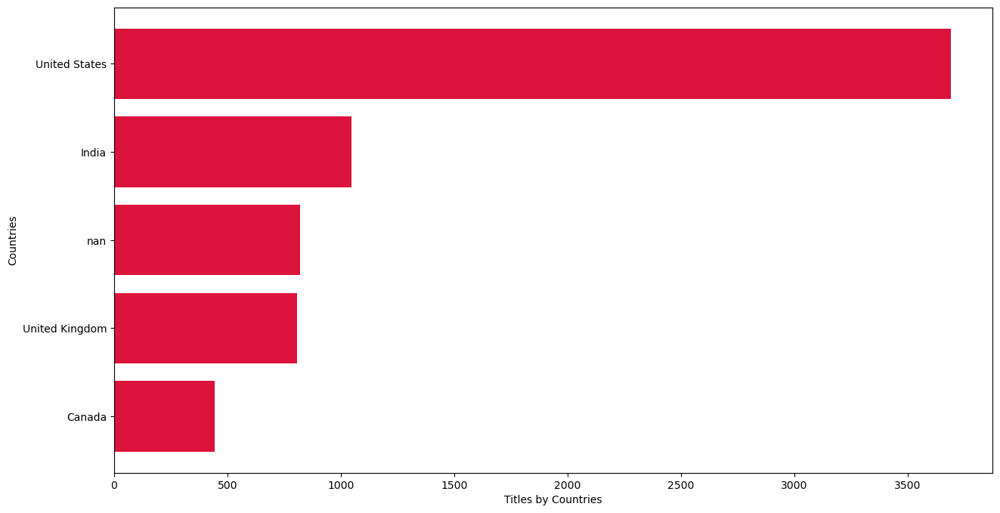

In [51]:
df_country=df_final1.groupby(['country']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:5]
plt.figure(figsize=(15,8))
plt.barh(df_country[::-1]['country'], df_country[::-1]['title'],color=['crimson'])
plt.xlabel('Titles by Countries')
plt.ylabel('Countries')
plt.show()

US,India,UK,Canada and France are leading countries in Content Creation on Netflix

In [52]:
#number of distinct titles on the basis of rating
df_final1.groupby(['rating']).agg({"title":"nunique"})

,title
rating,
G,41
NC-17,3
NR,80
PG,287
PG-13,490
R,799
TV-14,2151
TV-G,220
TV-MA,3204


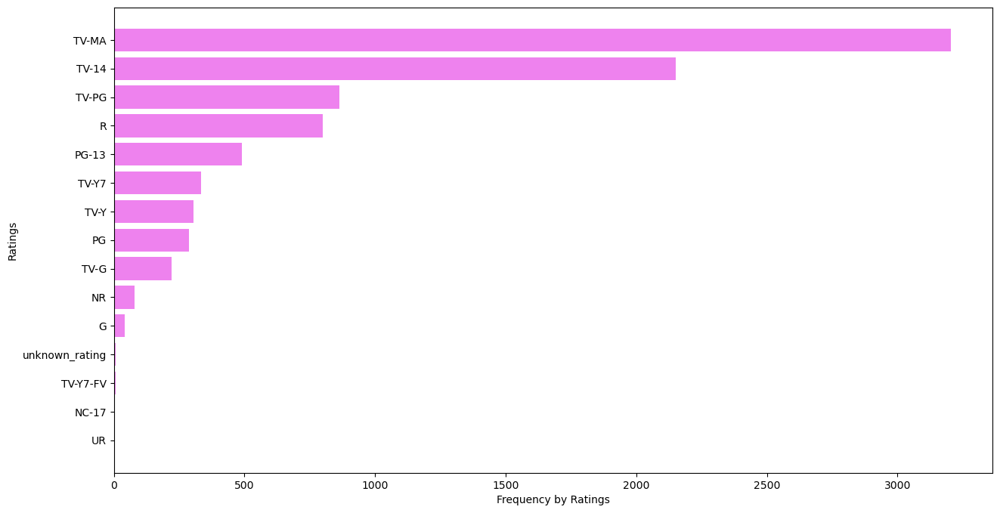

In [53]:
df_rating=df_final1.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['violet'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

Most of the highly rated content on Netflix is intended for Mature Audiences, R Rated, content not intended for audience under 14 and those which require Parental Guidance

In [54]:
#number of distinct titles on the basis of duration
df_final1.groupby(['duration']).agg({"title":"nunique"})

,title
duration,
1 Season,1793
1-50,287
10 Seasons,7
100-120,1671
11 Seasons,2
12 Seasons,2
120-150,891
13 Seasons,3
15 Seasons,2


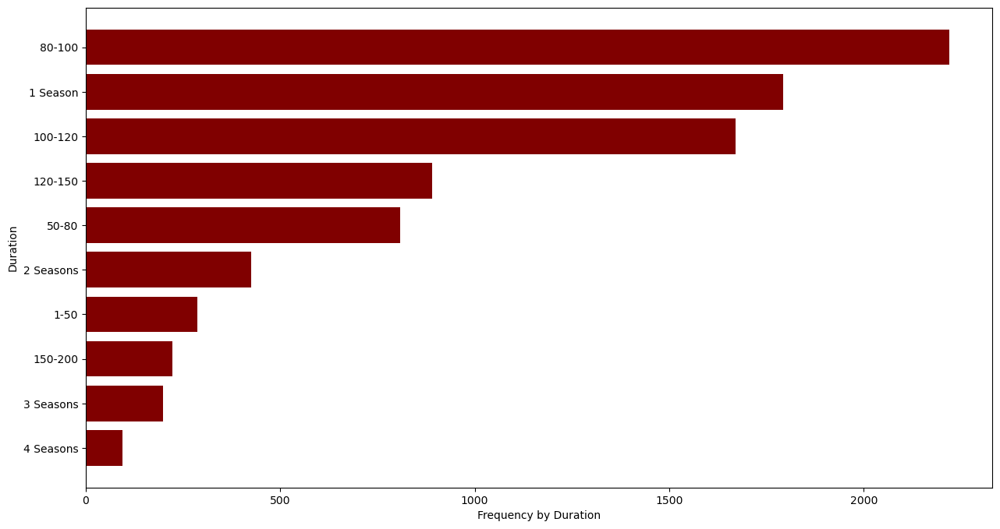

In [55]:
df_duration=df_final1.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['maroon'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

In [56]:
df_duration

,duration,title
20,80-100,2220
0,1 Season,1793
3,100-120,1671
6,120-150,891
16,50-80,808
11,2 Seasons,425
1,1-50,287
9,150-200,222
13,3 Seasons,199
14,4 Seasons,95


The duration of Most Watched content in our whole data is 80-100 mins.These must be movies and Shows having only 1 Season.

In [57]:
#number of distinct titles on the basis of Actors
df_final1.groupby(['cast']).agg({"title":"nunique"})

,title
cast,
Jr.,2
"""Riley"" Lakdhar Dridi",1
'Najite Dede,2
2 Chainz,1
2Mex,1
4Minute,1
50 Cent,5
9m88,1
A Boogie Wit tha Hoodie,1


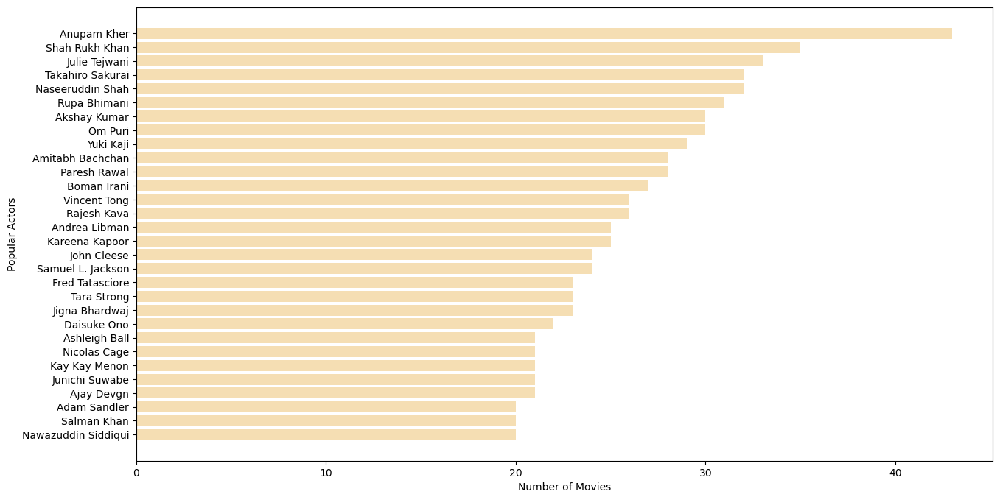

In [58]:
df_actors=df_final1.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:31]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['wheat'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actors')
plt.show()

Anupam Kher,SRK,Julie Tejwani, Naseeruddin Shah and Takahiro Sakurai occupy the top stop in Most Watched content.

In [59]:
#number of distinct titles on the basis of Actors
df_final1.groupby(['director']).agg({"title":"nunique"})

,title
director,
A. L. Vijay,2
A. Raajdheep,1
A. Salaam,1
A.R. Murugadoss,2
Aadish Keluskar,1
Aamir Bashir,1
Aamir Khan,1
Aanand Rai,1
Aaron Burns,1


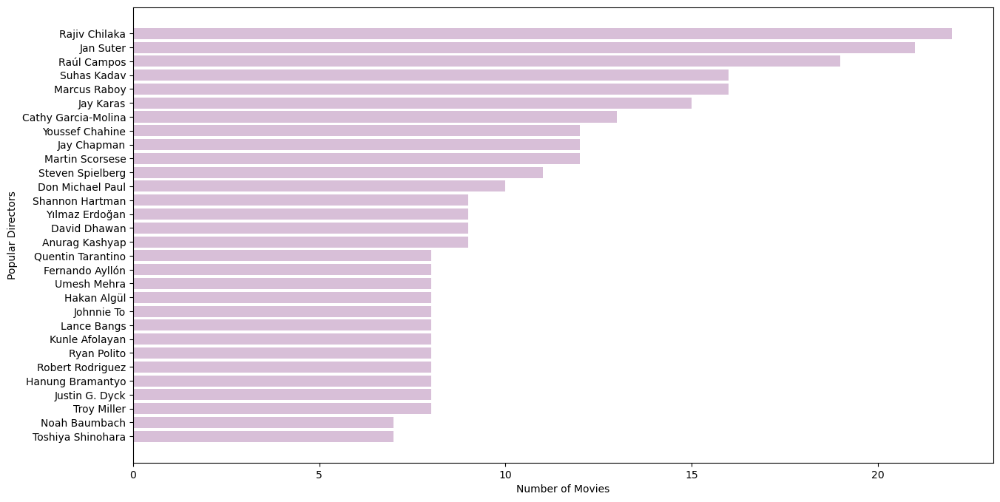

In [60]:
df_directors=df_final1.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:31]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['thistle'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

Rajiv Chilaka, Jan Suter and Raul Campos are the most popular directors across Netflix

In [61]:
#number of distinct titles on the basis of year
df_final1.groupby(['year']).agg({"title":"nunique"})

,title
year,
2008,2
2009,2
2010,1
2011,13
2012,3
2013,11
2014,24
2015,82
2016,432


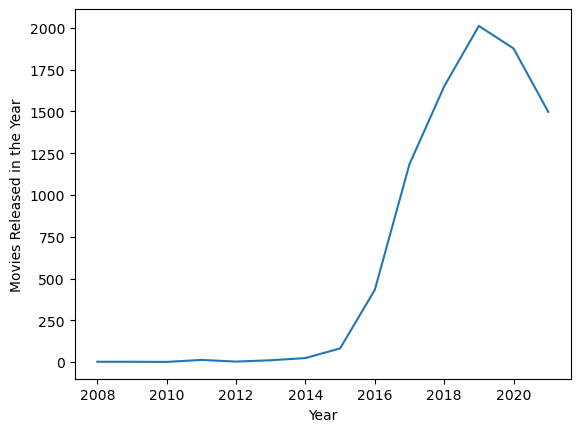

In [62]:
df_year=df_final1.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel("Year")
plt.show()

The Amount of Content across Netflix has increased from 2008 continuously till 2019. Then started decreasing from here and the peak somewehre around 2019 


In [63]:
#number of distinct titles on the basis of week
df_final1.groupby(['week_Added']).agg({"title":"nunique"})

,title
week_Added,
1,372
2,108
3,113
4,88
5,208
6,97
7,147
8,110
9,254


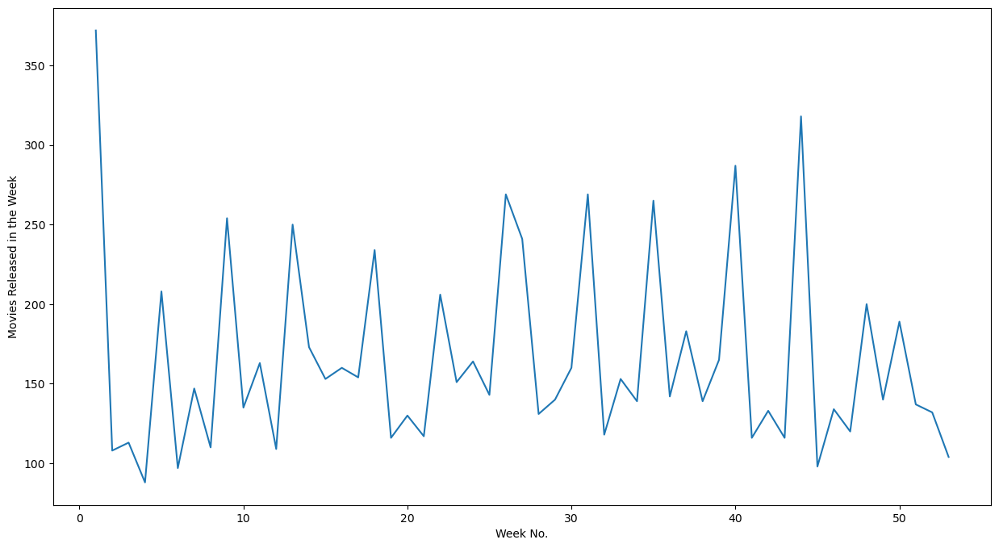

In [64]:
df_week=df_final1.groupby(['week_Added']).agg({"title":"nunique"}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week, x='week_Added', y='title')
plt.ylabel("Movies Released in the Week")
plt.xlabel("Week No.")
plt.show()

Most of the Content across Netflix is added in the first week of the year and then begin to increase slowly till December

In [65]:
#number of distinct titles on the basis of week
df_final1.groupby(['month_added']).agg({"title":"nunique"})

,title
month_added,
1,738
2,563
3,742
4,765
5,631
6,726
7,832
8,748
9,771


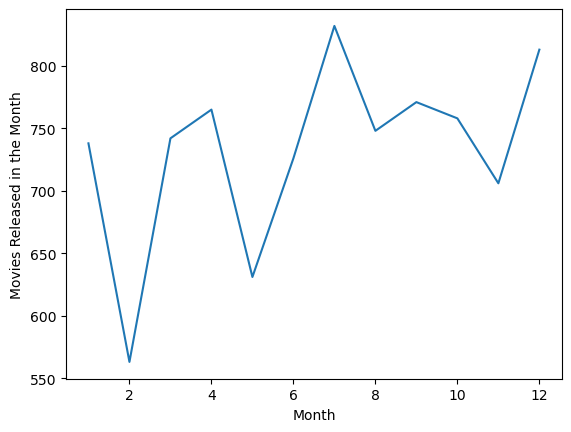

In [66]:
df_month=df_final1.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("Movies Released in the Month")
plt.xlabel("Month")
plt.show()

Most of the contents is added during the month of July to Aug

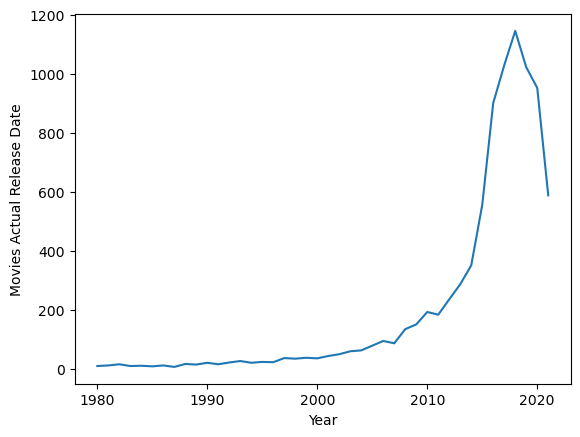

In [67]:
df_release_year=df_final1[df_final1['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

Net content release which are later uploaded to Netflix has increased since 1980 till 2020 though later reduced certainly due to COVID-19

### 

### Univariate Analysis separately for shows and movies

In [68]:
df_shows=df_final1[df_final1['type']=='TV Show']
df_movies=df_final1[df_final1['type']=='Movie']

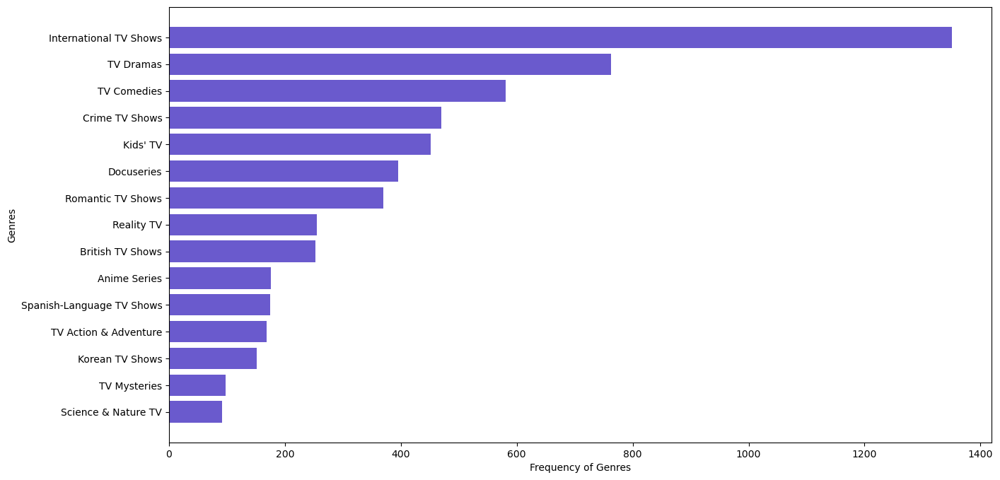

In [69]:
df_genre=df_shows.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['slateblue'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

International TV Shows, Dramas and Comedy Genres are popular across TV Shows in Netflix

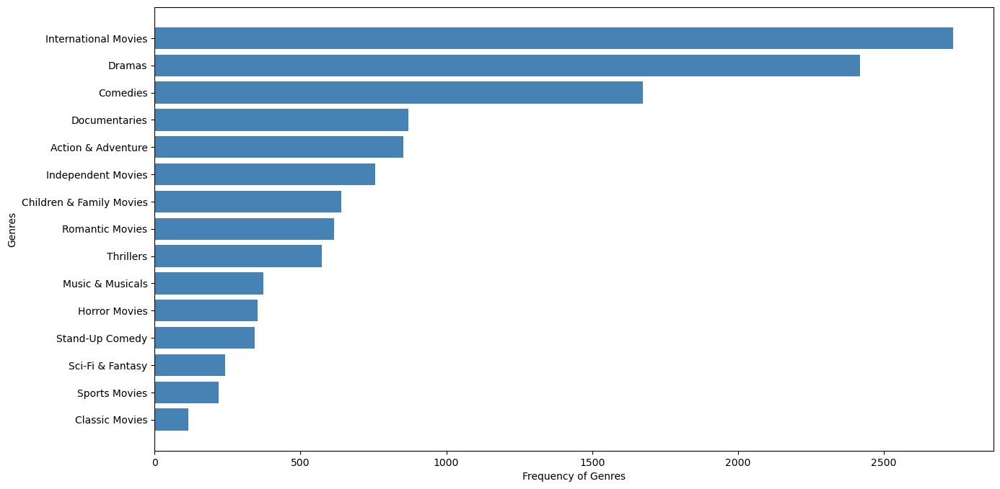

In [70]:
df_genre=df_movies.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['steelblue'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

International Movies, Dramas and Comedy Genres are popular followed by Documentaries across Movies on Netflix

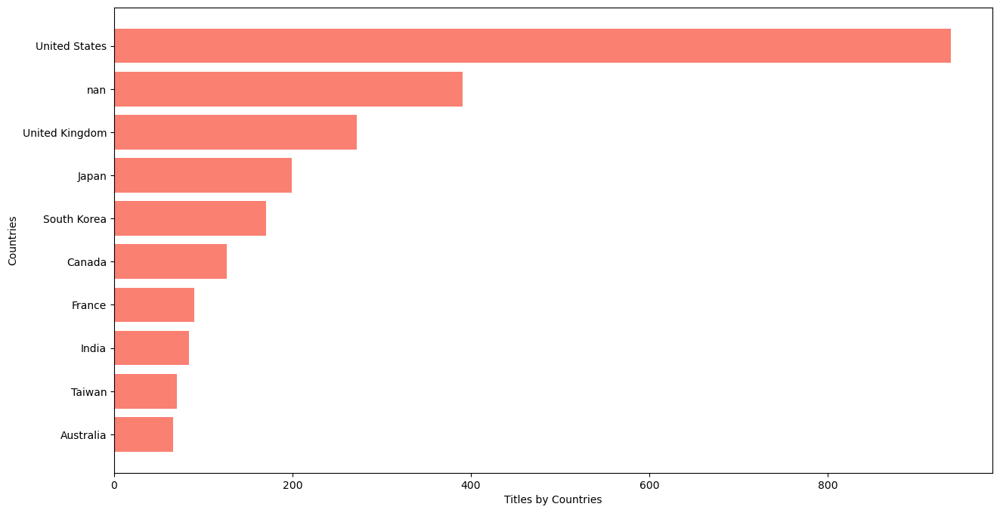

In [71]:
df_country=df_shows.groupby(['country']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_country[::-1]['country'], df_country[::-1]['title'],color=['salmon'])
plt.xlabel('Titles by Countries')
plt.ylabel('Countries')
plt.show()

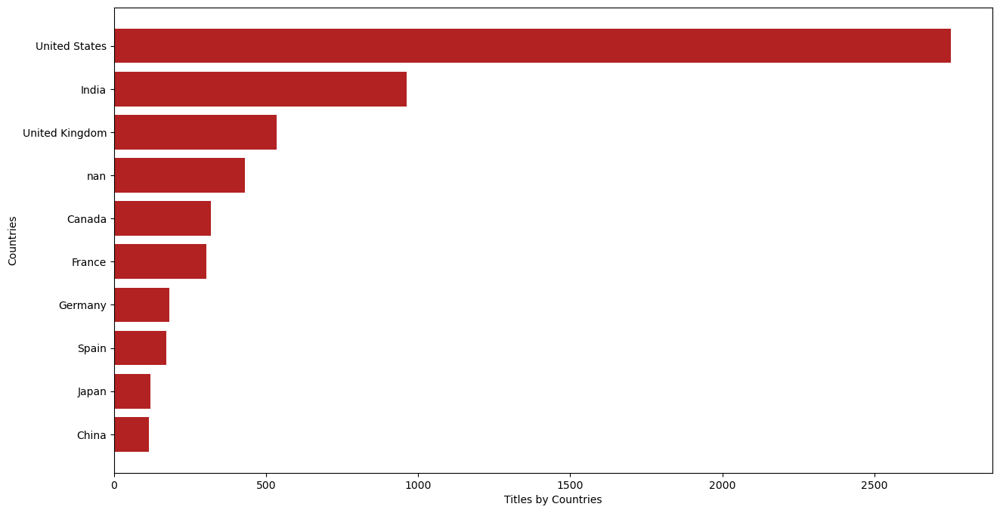

In [72]:
df_country=df_movies.groupby(['country']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_country[::-1]['country'], df_country[::-1]['title'],color=['firebrick'])
plt.xlabel('Titles by Countries')
plt.ylabel('Countries')
plt.show()

United States is leading across both TV Shows and Movies, UK also provides great content across TV Shows and Movies. Surprisingly India is much more prevalent in Movies as compared TV Shows.

Moreover the number of Movies created in India outweigh the sum of TV Shows and Movies across UK since India was rated as second in net sum of whole content across Netflix.

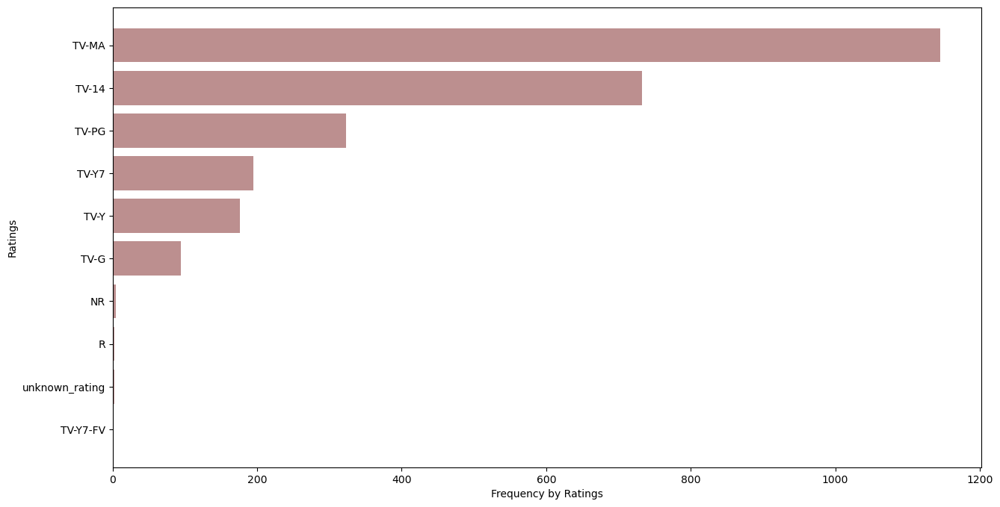

In [73]:
df_rating=df_shows.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['rosybrown'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

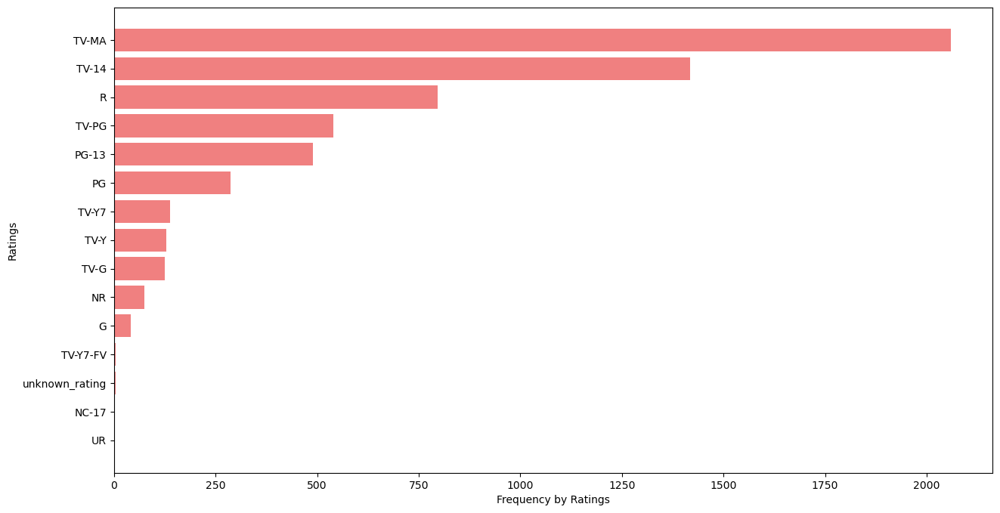

In [74]:
df_rating=df_movies.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['lightcoral'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

So it seems plaussible to conclude that the popular ratings across Netflix includes Mature Audiences and those appropriate for over 14/over 17 ages.

Moreover there are no TV Shows having a rating of R

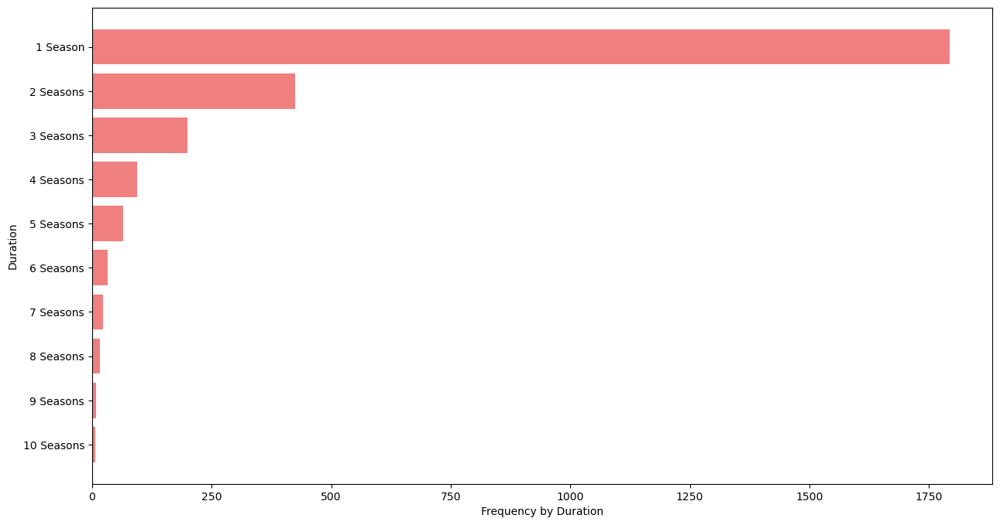

In [75]:
df_duration=df_shows.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['lightcoral'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

Across TV Shows, shows having only 1 Season are common as soon as the season length increases, the number of shows decrease and this definitely sounds as expected

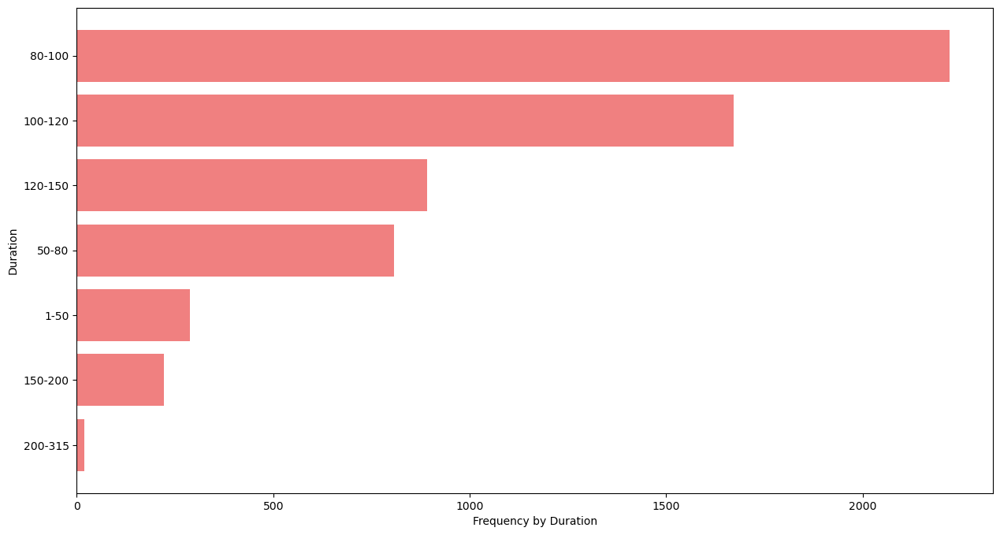

In [76]:
df_duration=df_movies.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['lightcoral'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

Across movies 80-100,100-120 and 120-150 is the ranges of minutes for which most movies lie. So quite possibly 80-150 mins is the sweet spot we would be wanting for movies.

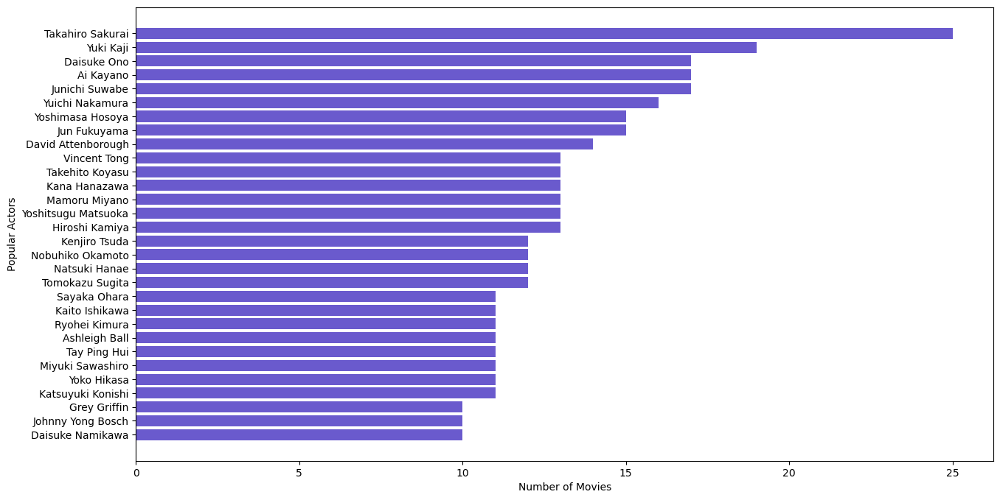

In [77]:
df_actors=df_shows.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:31]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['slateblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actors')
plt.show()

Takahiro Sakurai,Yuki Kaji and other South Korean/Japanese actors are the most popular actors across TV Shows

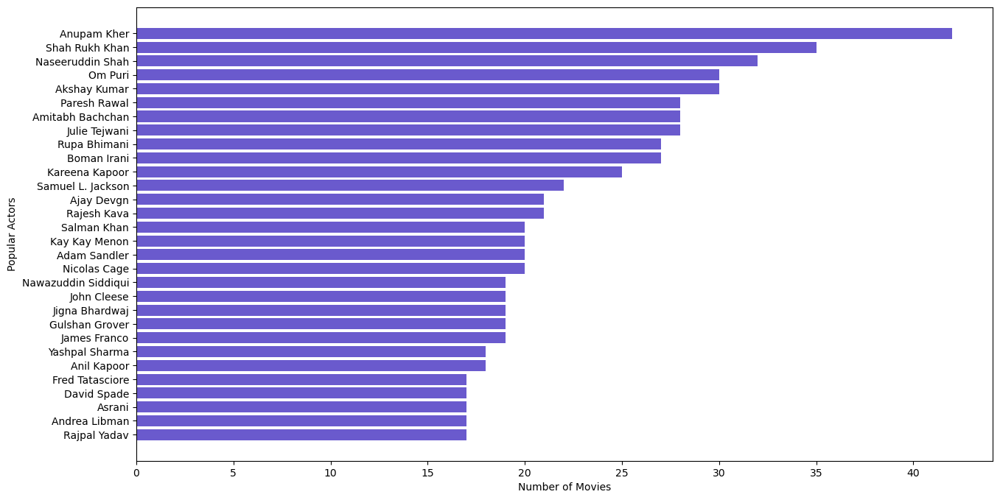

In [78]:
df_actors=df_movies.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:31]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['slateblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actors')
plt.show()

Our bollywood actors such as Anupam Kher, SRK, Naseeruddin Shah are very much popular acrossmovies on Netflix

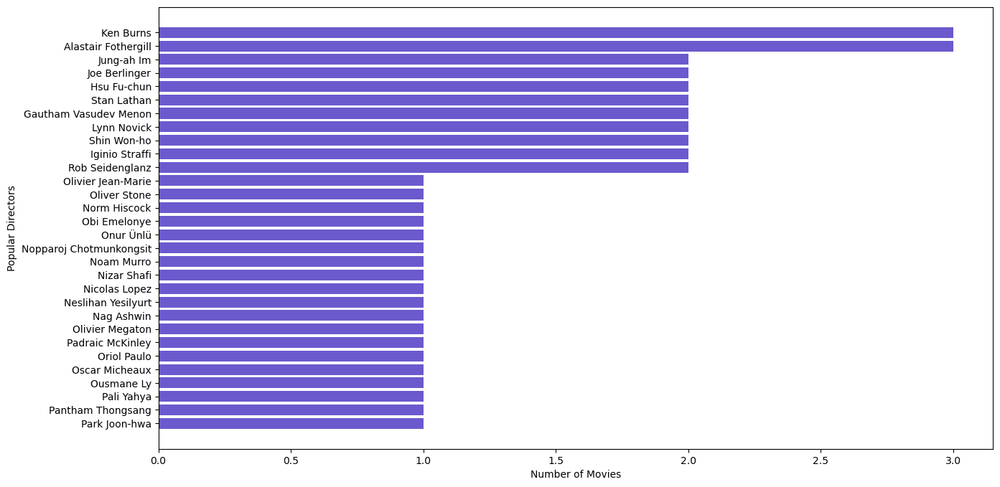

In [79]:
df_directors=df_shows.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:31]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['slateblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

Ken Burns, Alastair Fothergill, Stan Lathan, Joe Barlinger are popular directors across TV Shows on Netflix

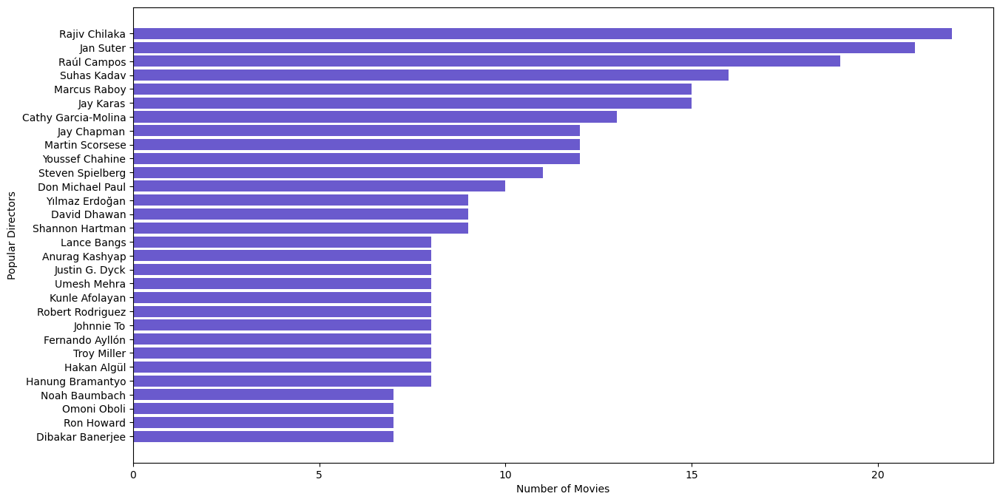

In [80]:
df_directors=df_movies.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:31]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['slateblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

Rajiv Chilka, Jan Suter, Raul Campos, Suhas Kadav are popular directors across movies

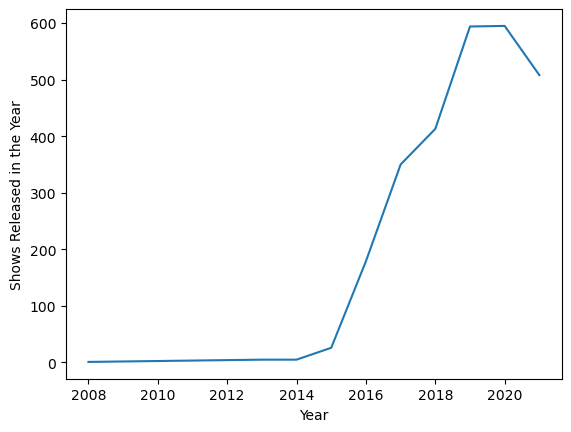

In [81]:
df_year=df_shows.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Shows Released in the Year")
plt.xlabel("Year")
plt.show()

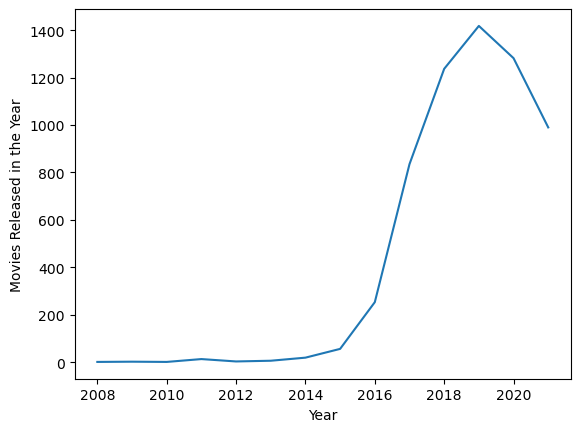

In [82]:
df_year=df_movies.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel("Year")
plt.show()

Till 2019, overall content across Netflix was increasing but due to Covid in 2020, though TV Shows didn't take a hit then Movies did take a hit. Well later in 2021, content across both was reduced significantly

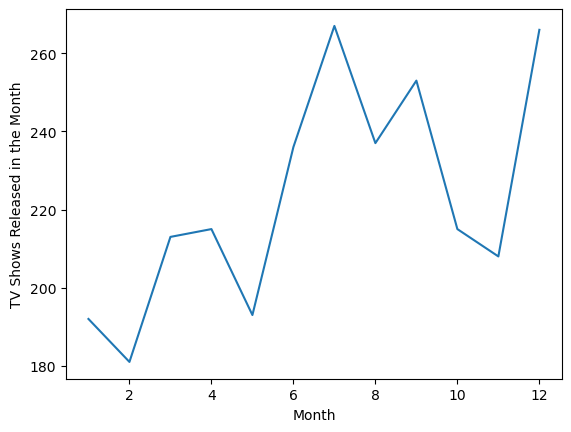

In [83]:
df_month=df_shows.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("TV Shows Released in the Month")
plt.xlabel("Month")
plt.show()

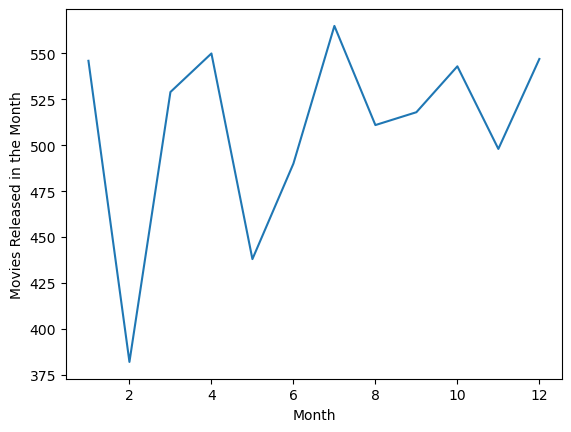

In [84]:
df_month=df_movies.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("Movies Released in the Month")
plt.xlabel("Month")
plt.show()

TV Shows are added in Netflix by a tremendous amount in mid weeks/months of the year, i.e- July

Movies are added in Netflix by a tremendous amount in first week/last month of current year and first month of next year

## Questions to be Explored Now for Recommendations


1) So this time, the granularity level is country and analysis of TV Shows/Movies the country brings. I am going to consider  only the top countries individually for TV Shows and Movies. There are definitely some common countries too which bring out quality content in both TV Shows and Movies.

2) Which Genres do these countries offer and what are the intended audiences(Ratings) which are popular in Netflix?

3) In case of Movies, what is the duration/length of movies which makes them special and depicts attention span?

4) Who are the popular actors/directors across TV Shows and Movies in these countries?

5) In what time of the year, people tend to watch movies and shows in these countries?

6) Popular Actor and Director Combinations in these countries

In [85]:
#below countries will be analyzed for both shows and movies
shows_and_movies=['United States','India','United Kingdom']
#below countries will be only analyzed on basis of shows
only_shows=['Japan','South Korea']

## Univariate Analysis separately for shows and movies in USA

In [86]:
#Analyzing USA for both shows and movies
df_usa_shows=df_final1[df_final1['country']=='United States'][df_final1[df_final1['country']=='United States']['type']=='TV Show']
df_usa_movies=df_final1[df_final1['country']=='United States'][df_final1[df_final1['country']=='United States']['type']=='Movie']

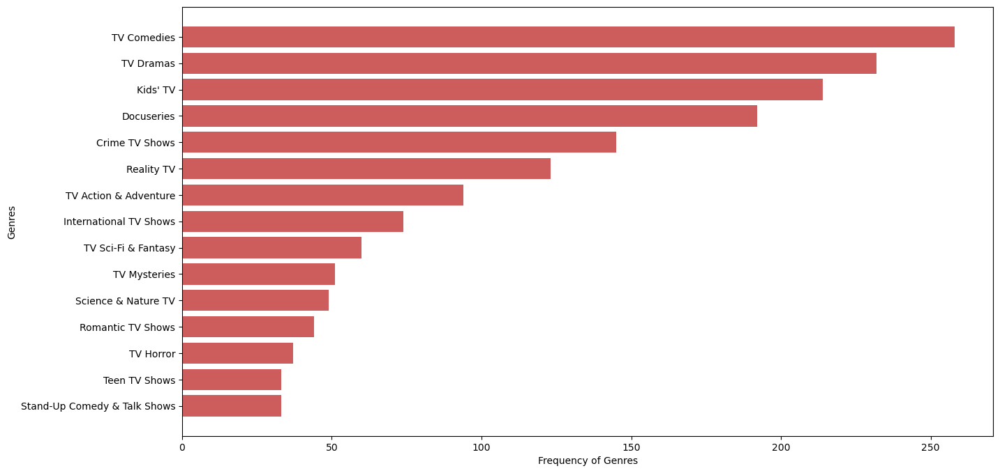

In [87]:
df_genre=df_usa_shows.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['indianred'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

Dramas,Comedy, Kids 'TV Shows, International TV Shows and Docuseries, Genres are popular in TV Series in USA

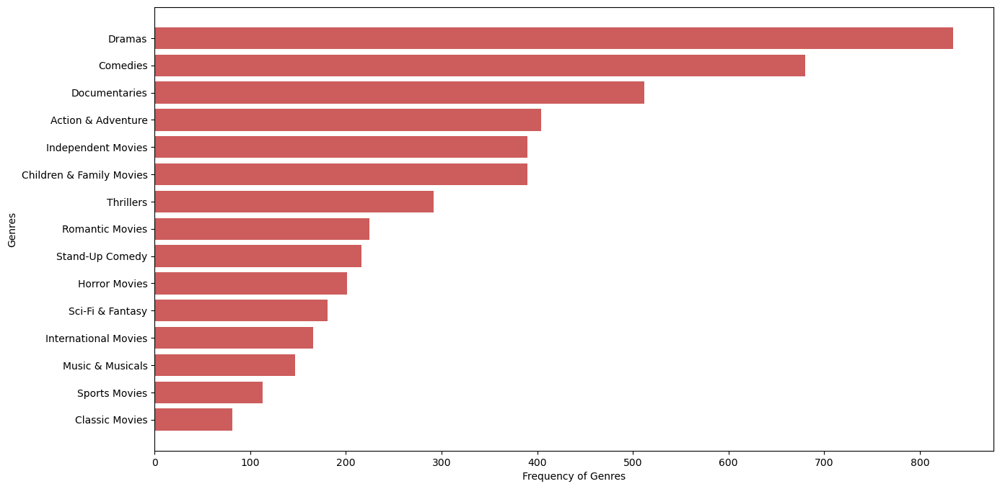

In [88]:
df_genre=df_usa_movies.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['indianred'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

Dramas,Comedy, Documentaries, Family Movies and Action Genres in Movies are popular in USA

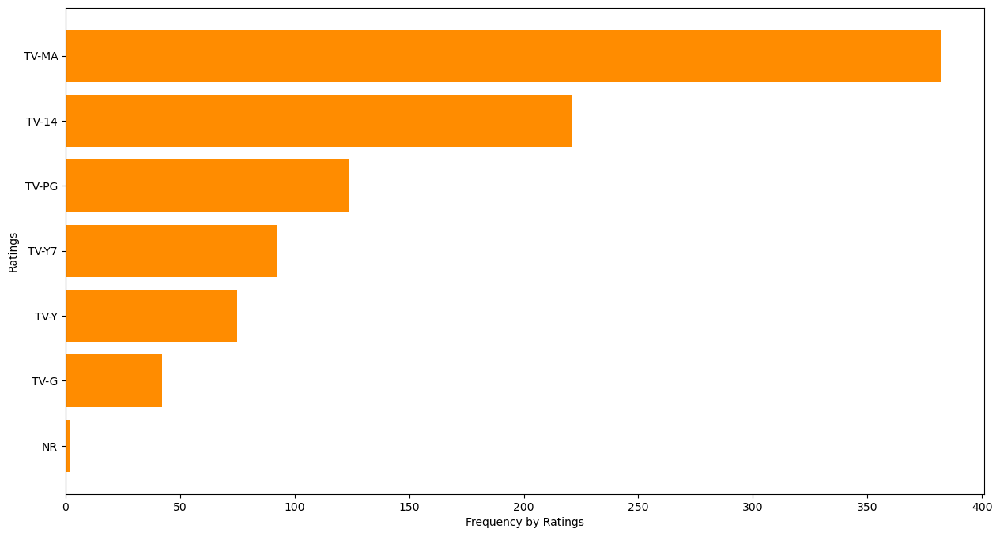

In [89]:
df_rating=df_usa_shows.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['darkorange'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

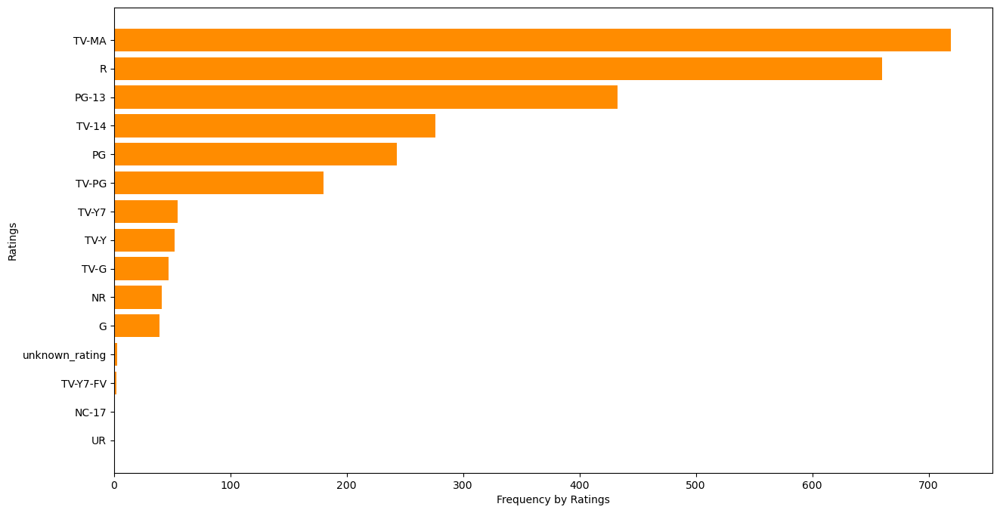

In [90]:
df_rating=df_usa_movies.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['darkorange'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

#### So it seems plaussible to conclude that the popular ratings across Netflix includes Mature Audiences and those appropriate for over 14/over 17 ages in both Movies and TV Shows in USA

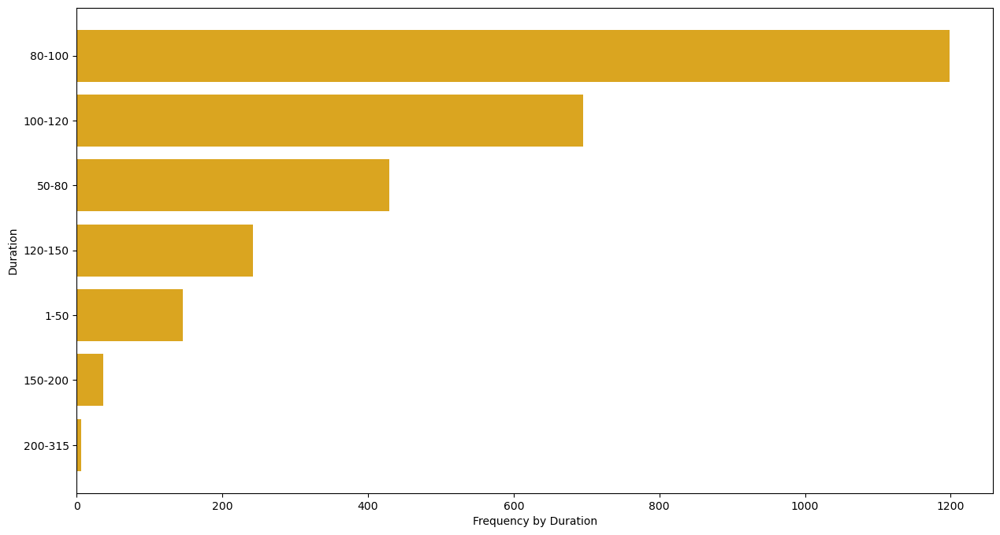

In [91]:
df_duration=df_usa_movies.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['goldenrod'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

Across movies 80-100,100-120 is the ranges of minutes for which most movies lie. So quite possibly 80-120 mins is the sweet spot we would be wanting for movies in USA

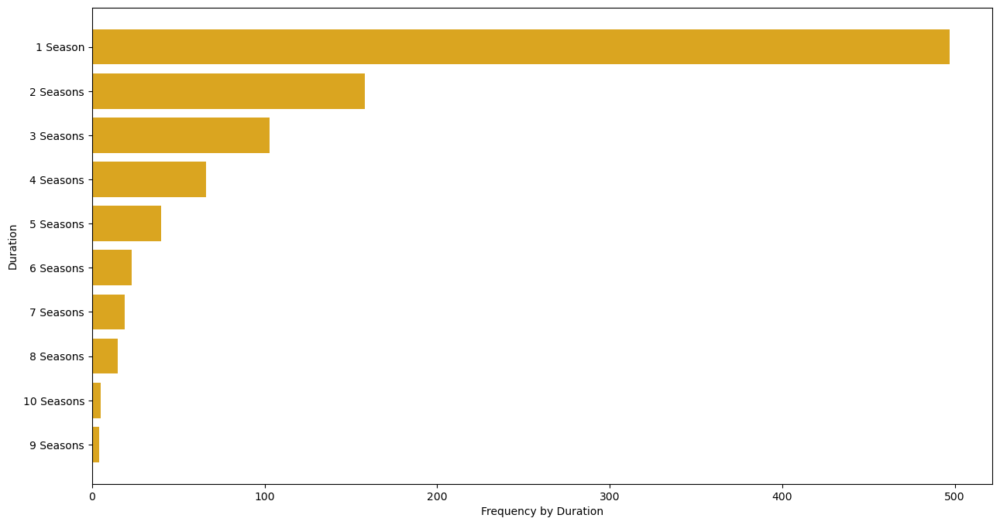

In [92]:
df_duration=df_usa_shows.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['goldenrod'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

Across TV shows mostly single season TV shows are preffered IN USA

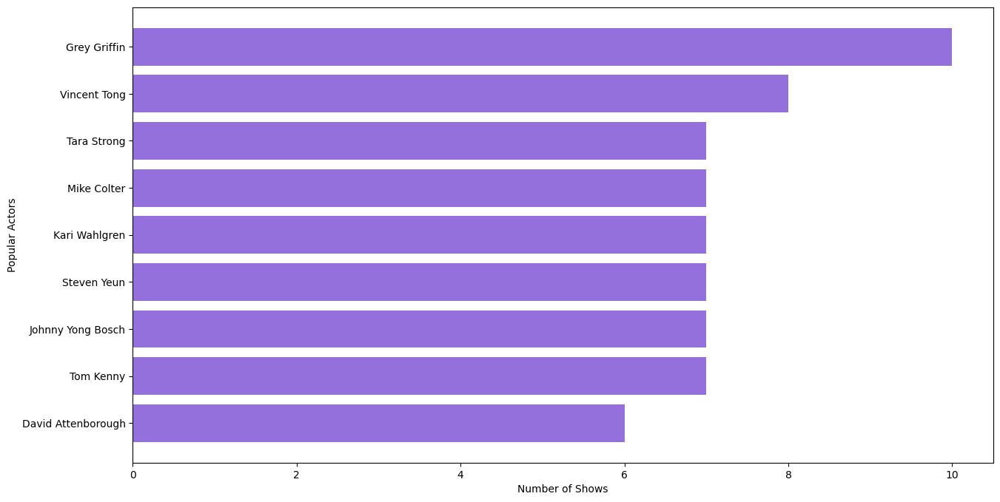

In [93]:
df_actors=df_usa_shows.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['mediumpurple'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actors')
plt.show()

Vincent Tong,Grey Griffin and Tara Strong are the most popular actors across TV Shows in USA

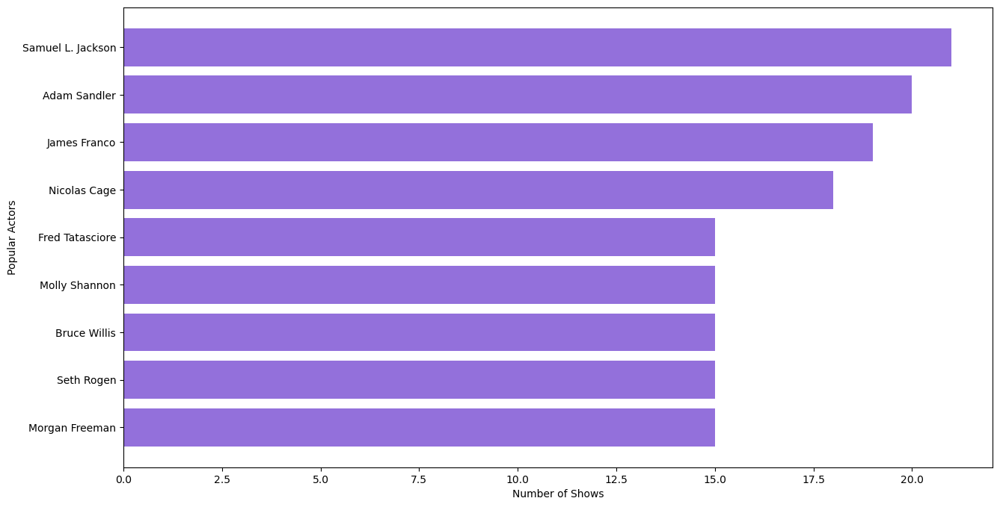

In [94]:
df_actors=df_usa_movies.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['mediumpurple'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actors')
plt.show()

Samuel Jackson,Adam Sandler,James Franco and Nicolas Cage are very much popular across movies on Netflix in USA

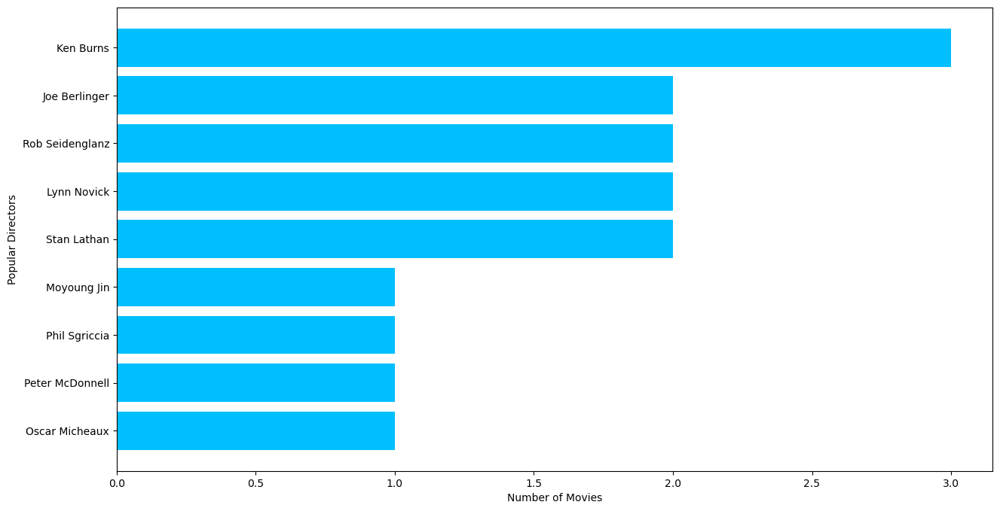

In [95]:
df_directors=df_usa_shows.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['deepskyblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

Ken Burns,Stan Lathan, Joe Barlinger are popular directors across TV Shows on Netflix in USA

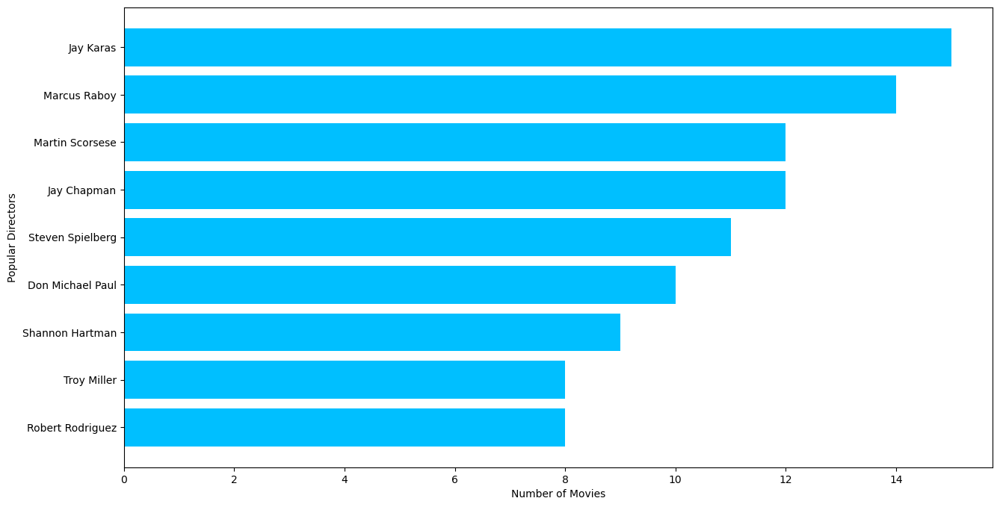

In [96]:
df_directors=df_usa_movies.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['deepskyblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

Jay Karas,Marcus Raboy,Martin Scorcese and Jay Chapman are popular directors across movies in USA

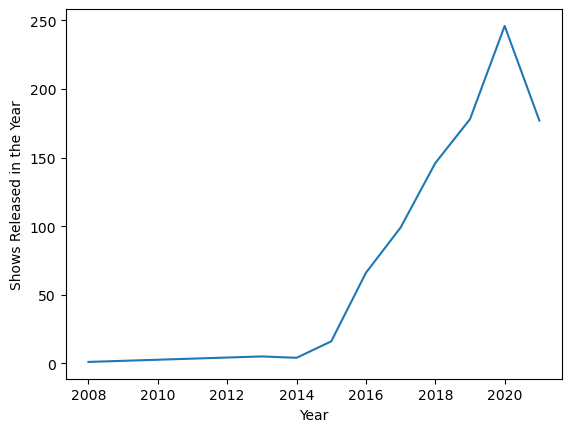

In [97]:
df_year=df_usa_shows.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Shows Released in the Year")
plt.xlabel("Year")
plt.show()

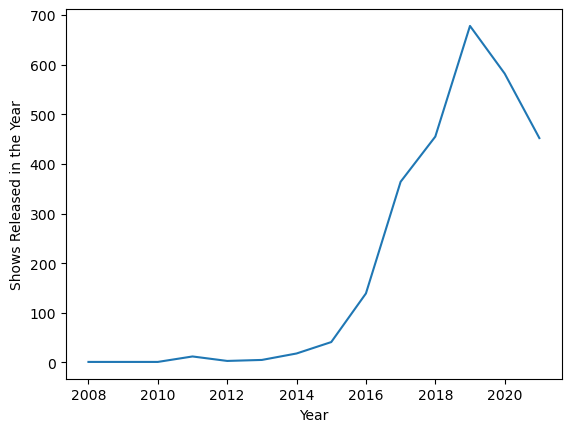

In [98]:
df_year=df_usa_movies.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Shows Released in the Year")
plt.xlabel("Year")
plt.show()

In USA, number of shows remained the same in 2021 as they were in 2020 while number of movies declined:

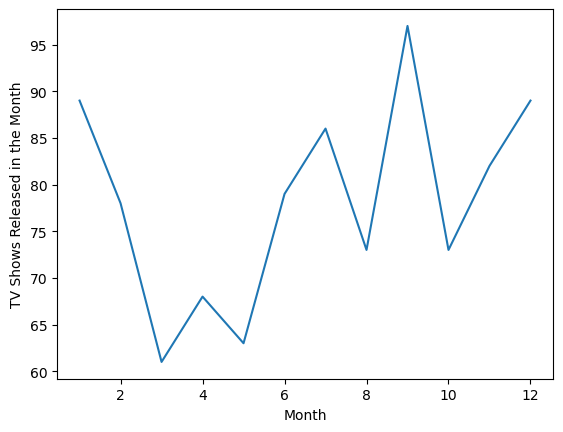

In [99]:
df_month=df_usa_shows.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("TV Shows Released in the Month")
plt.xlabel("Month")
plt.show()

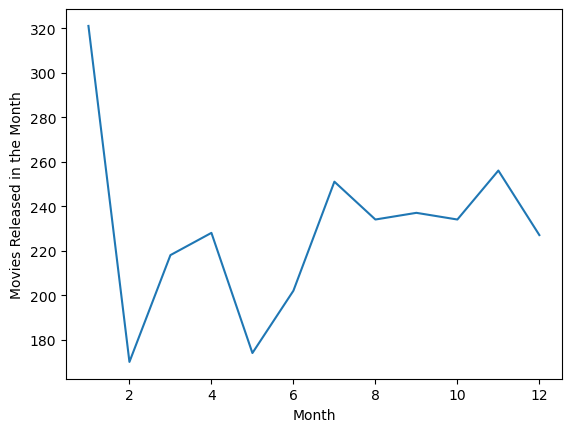

In [100]:
df_month=df_usa_movies.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("Movies Released in the Month")
plt.xlabel("Month")
plt.show()

TV Shows are added in Netflix by a tremendous amount in July and September in USA

Movies are added in Netflix in USA by a tremendous amount in first week/last month of current year and first month of next year

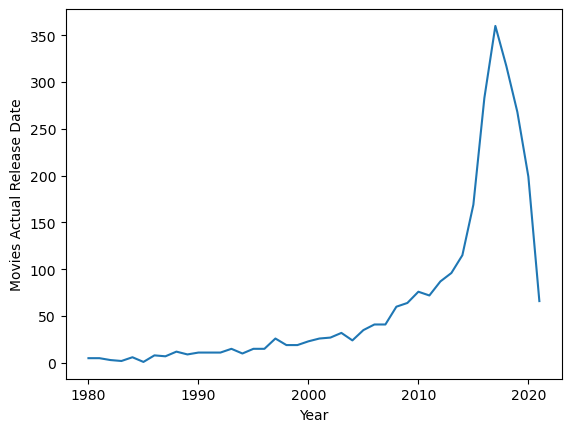

In [101]:
df_release_year=df_usa_movies[df_usa_movies['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

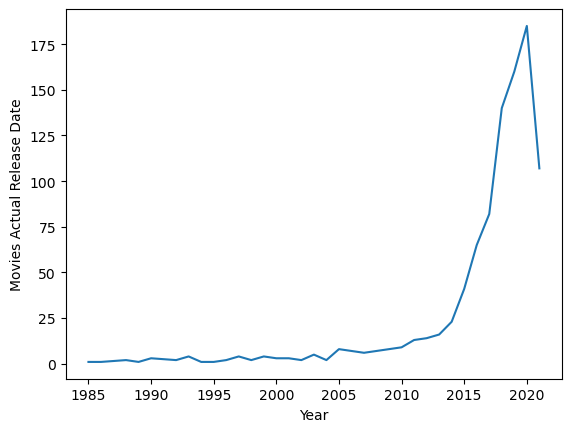

In [102]:
df_release_year=df_usa_shows[df_usa_shows['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

In USA, though both Movies and Shows have reduced in 2021, the amount of decrease in number of TV Shows is small as compared to Movies this implies that people are liking tv shows more than movies.

In [103]:
df_usa_movies.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year
0,Dick Johnson Is Dead,Kirsten Johnson,unkown_cast,United States,Documentaries,s1,Movie,"September 25, 2021",2020,PG-13,80-100,2021-09-25,9,38,2021
179,Sankofa,Haile Gerima,Kofi Ghanaba,United States,Dramas,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021
180,Sankofa,Haile Gerima,Kofi Ghanaba,United States,Independent Movies,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021
181,Sankofa,Haile Gerima,Kofi Ghanaba,United States,International Movies,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021
197,Sankofa,Haile Gerima,Oyafunmike Ogunlano,United States,Dramas,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021


In [104]:
#Analysing a combination of actors and directors
df_usa_movies['Actor_Director_Combination'] = df_usa_movies.cast.str.cat(df_usa_movies.director, sep=' and ')
df_usa_movies_subset=df_usa_movies[df_usa_movies['cast']!='unkown_cast']
df_usa_movies_subset=df_usa_movies_subset[df_usa_movies_subset['director']!='unkown_director']
df_usa_movies_subset.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
179,Sankofa,Haile Gerima,Kofi Ghanaba,United States,Dramas,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021,Kofi Ghanaba and Haile Gerima
180,Sankofa,Haile Gerima,Kofi Ghanaba,United States,Independent Movies,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021,Kofi Ghanaba and Haile Gerima
181,Sankofa,Haile Gerima,Kofi Ghanaba,United States,International Movies,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021,Kofi Ghanaba and Haile Gerima
197,Sankofa,Haile Gerima,Oyafunmike Ogunlano,United States,Dramas,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021,Oyafunmike Ogunlano and Haile Gerima
198,Sankofa,Haile Gerima,Oyafunmike Ogunlano,United States,Independent Movies,s8,Movie,"September 24, 2021",1993,TV-MA,120-150,2021-09-24,9,38,2021,Oyafunmike Ogunlano and Haile Gerima


In [105]:
df_usa_shows['Actor_Director_Combination'] = df_usa_shows.cast.str.cat(df_usa_shows.director, sep=' and ')
df_usa_shows_subset=df_usa_shows[df_usa_shows['cast']!='unkown_cast']
df_usa_shows_subset=df_usa_shows_subset[df_usa_shows_subset['director']!='unkown_director']
df_usa_shows_subset.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
9348,The Flash,Glen Winter,Grant Gustin,United States,Crime TV Shows,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,2021-07-28,7,30,2021,Grant Gustin and Glen Winter
9349,The Flash,Glen Winter,Grant Gustin,United States,TV Action & Adventure,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,2021-07-28,7,30,2021,Grant Gustin and Glen Winter
9350,The Flash,Glen Winter,Grant Gustin,United States,TV Sci-Fi & Fantasy,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,2021-07-28,7,30,2021,Grant Gustin and Glen Winter
9351,The Flash,Glen Winter,Candice Patton,United States,Crime TV Shows,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,2021-07-28,7,30,2021,Candice Patton and Glen Winter
9352,The Flash,Glen Winter,Candice Patton,United States,TV Action & Adventure,s381,TV Show,"July 28, 2021",2021,TV-14,7 Seasons,2021-07-28,7,30,2021,Candice Patton and Glen Winter


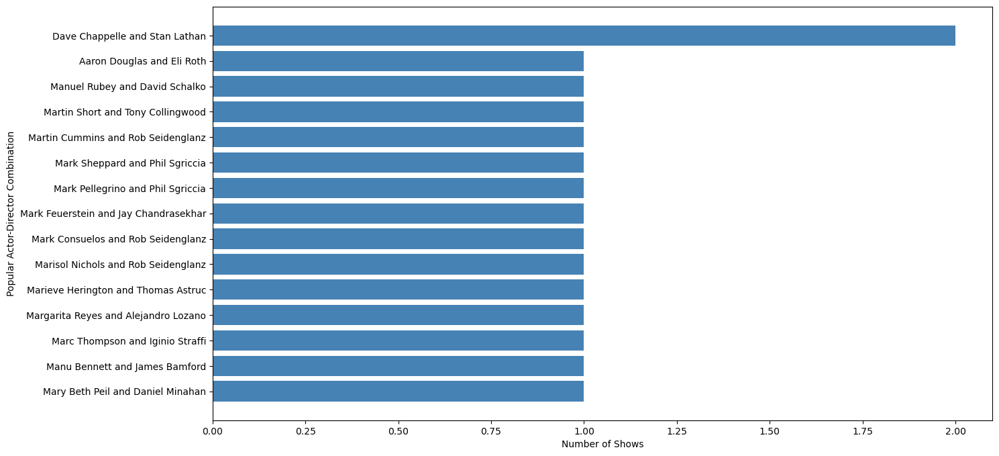

In [106]:
df_actors_directors=df_usa_shows_subset.groupby(['Actor_Director_Combination']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_actors_directors[::-1]['Actor_Director_Combination'], df_actors_directors[::-1]['title'],color=['steelblue'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actor-Director Combination')
plt.show()

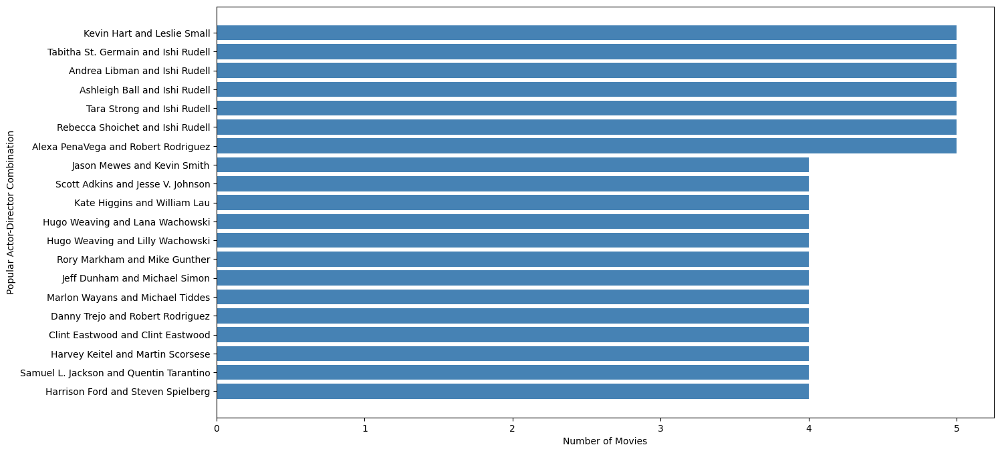

In [107]:
df_actors_directors=df_usa_movies_subset.groupby(['Actor_Director_Combination']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:20]
plt.figure(figsize=(15,8))
plt.barh(df_actors_directors[::-1]['Actor_Director_Combination'], df_actors_directors[::-1]['title'],color=['steelblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actor-Director Combination')
plt.show()

In [108]:
df_actors_directors[::-1]['Actor_Director_Combination'].values

array(['Harrison Ford and Steven Spielberg',
       'Samuel L. Jackson and Quentin Tarantino',
       'Harvey Keitel and Martin Scorsese',
       'Clint Eastwood and Clint Eastwood',
       'Danny Trejo and Robert Rodriguez',
       'Marlon Wayans and Michael Tiddes',
       'Jeff Dunham and Michael Simon', 'Rory Markham and Mike Gunther',
       'Hugo Weaving and Lilly Wachowski',
       'Hugo Weaving and Lana Wachowski', 'Kate Higgins and William Lau',
       'Scott Adkins and Jesse V. Johnson', 'Jason Mewes and Kevin Smith',
       'Alexa PenaVega and Robert Rodriguez',
       'Rebecca Shoichet and Ishi Rudell', 'Tara Strong and Ishi Rudell',
       'Ashleigh Ball and Ishi Rudell', 'Andrea Libman and Ishi Rudell',
       'Tabitha St. Germain and Ishi Rudell',
       'Kevin Hart and Leslie Small'], dtype=object)

**The Most Popular Actor Director Combination in Movies Across USA are:-**

'Smith Foreman and Stanley Moore',
<br>
'Marlon Wayans and Michael Tiddes',
<br>
'Adam Sandler and Steve Brill',
<br>
'Maisie Benson and Stanley Moore',
<br>
'Ashleigh Ball and Ishi Rudell',
<br>
'Tara Strong and Ishi Rudell',
<br>
'Rebecca Shoichet and Ishi Rudell',
<br>
'Kerry Gudjohnsen and Alex Woo',
<br>
'Kerry Gudjohnsen and Stanley Moore',
<br>
'Paul Killam and Alex Woo',
<br>
'Paul Killam and Stanley Moore',
<br>
'Andrea Libman and Ishi Rudell',
<br>
'Kevin Hart and Leslie Small',
<br>
'Maisie Benson and Alex Woo',
<br>
'Alexa PenaVega and Robert Rodriguez',
<br>
'Tabitha St. Germain and Ishi Rudell'







**The Second Most Popular Actor Director Combination in Movies Across USA are:-**
<br>
'Rory Markham and Mike Gunther',
<br>
'Erin Mathews and Steve Ball',
<br>
'Danny Trejo and Robert Rodriguez',
<br>
'Jeff Dunham and Michael Simon'
<br>


## Univariate Analysis separately for shows and movies in India

In [109]:
#Analyzing India for both shows and movies
df_india_shows=df_final1[df_final1['country']=='India'][df_final1[df_final1['country']=='India']['type']=='TV Show']
df_india_movies=df_final1[df_final1['country']=='India'][df_final1[df_final1['country']=='India']['type']=='Movie']

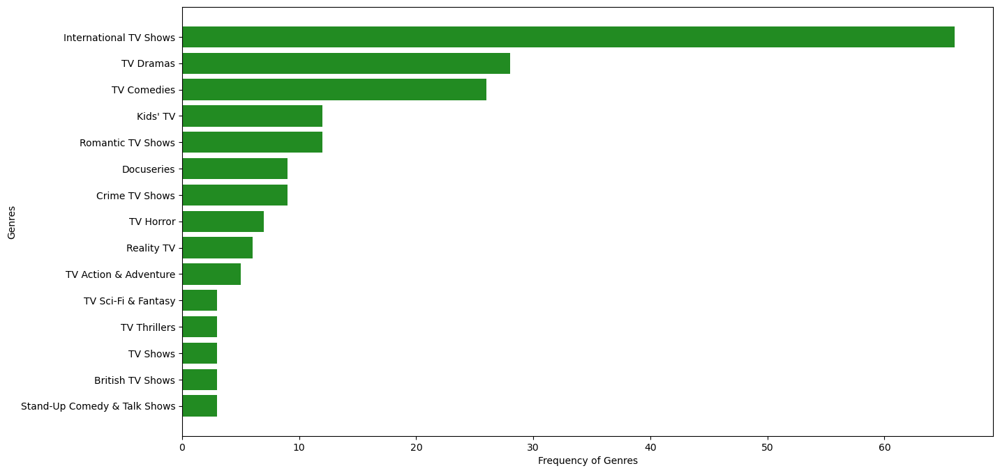

In [110]:
df_genre=df_india_shows.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['forestgreen'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

Dramas,Comedy, Kids 'TV Shows and International TV Shows Genres are popular in TV Series in India

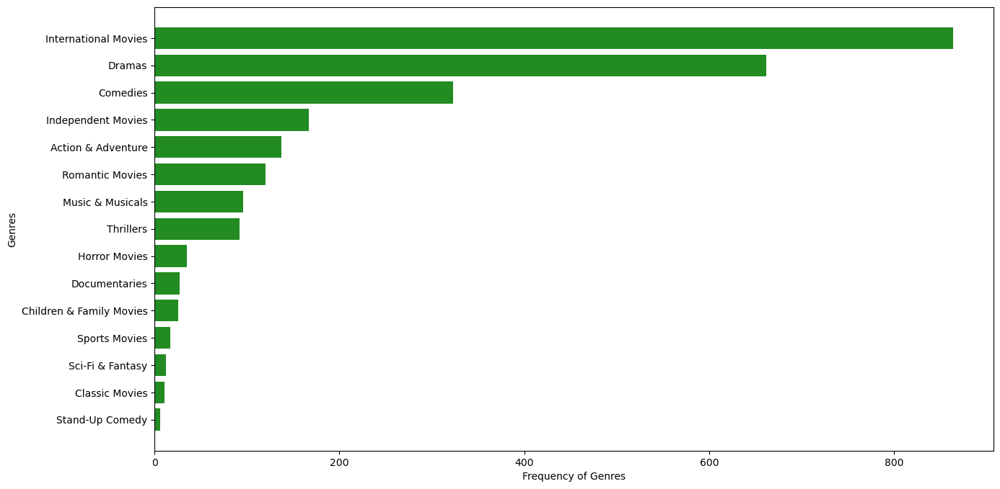

In [111]:
df_genre=df_india_movies.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['forestgreen'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

International Movies,Drama,Comedy,Indpeendent Movies and Action, Romance Genres are prevalent in India

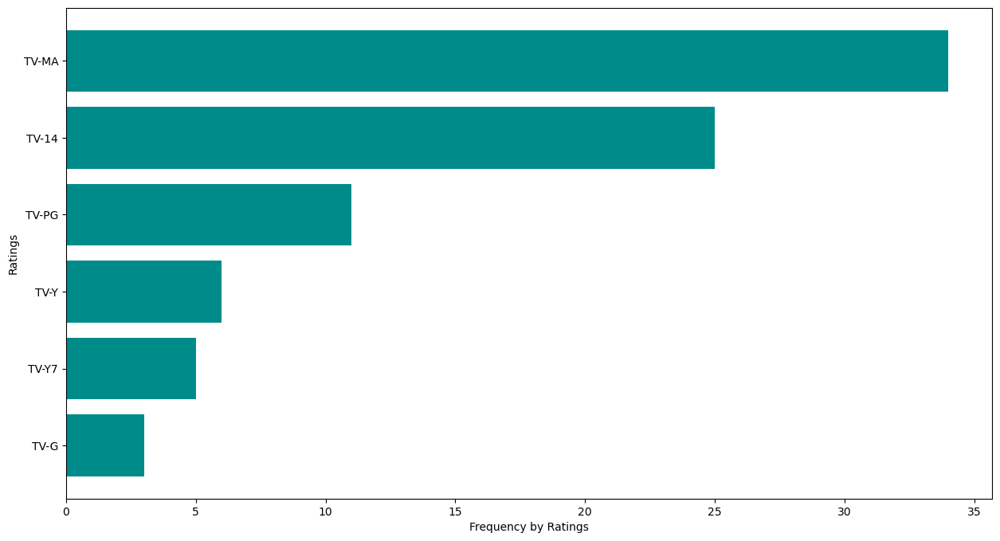

In [112]:
df_rating=df_india_shows.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['darkcyan'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

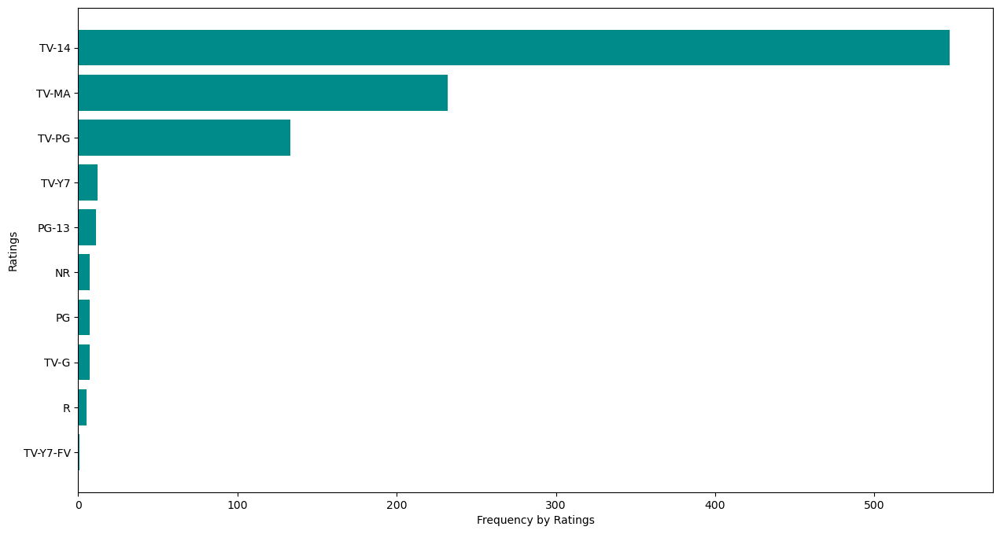

In [113]:
df_rating=df_india_movies.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['darkcyan'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

So it seems plaussible to conclude that the popular ratings across Netflix includes Mature Audiences in TV Shows and those appropriate for people over 14 in Movies in India.

Now this indeed seems to be the case. Indian TV Shows in Netflix are without a shadow of doubt intended for Mature Audiences while Movies for over 14 years of age.

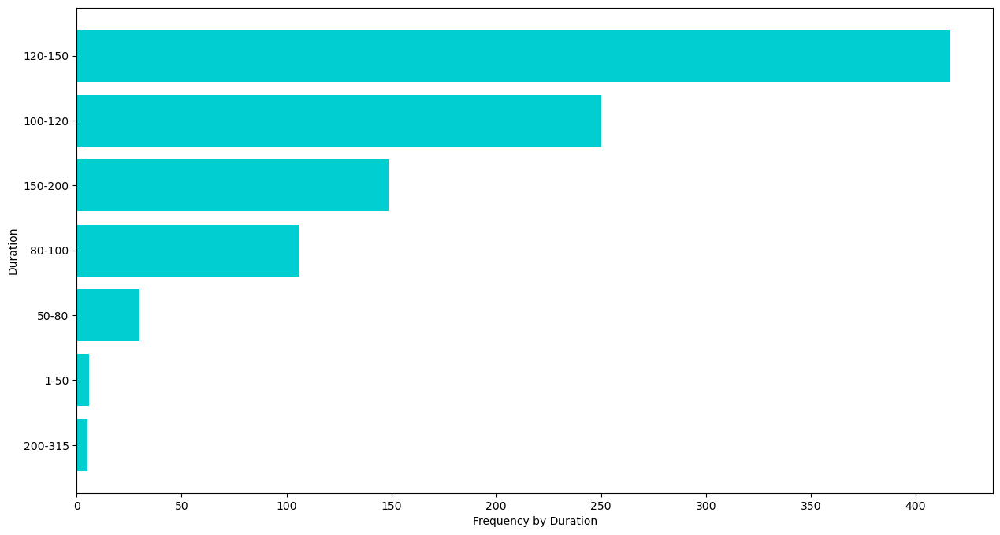

In [114]:
df_duration=df_india_movies.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['darkturquoise'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

Across movies ranges of minutes in India are comparatively greater than USA with a sweet spot at 120-150 mins.

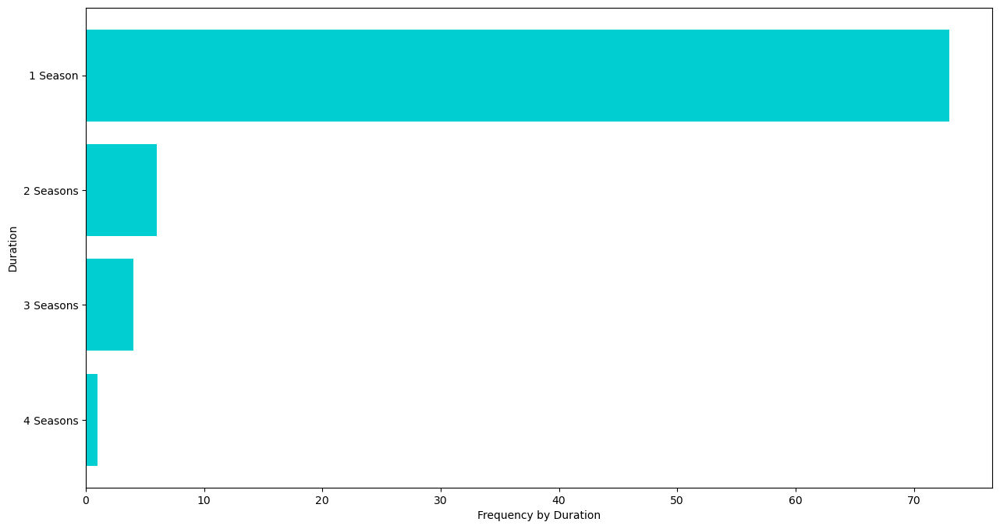

In [115]:
df_duration=df_india_shows.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['darkturquoise'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

TV shows which are concluded in a single season are most famous in India.

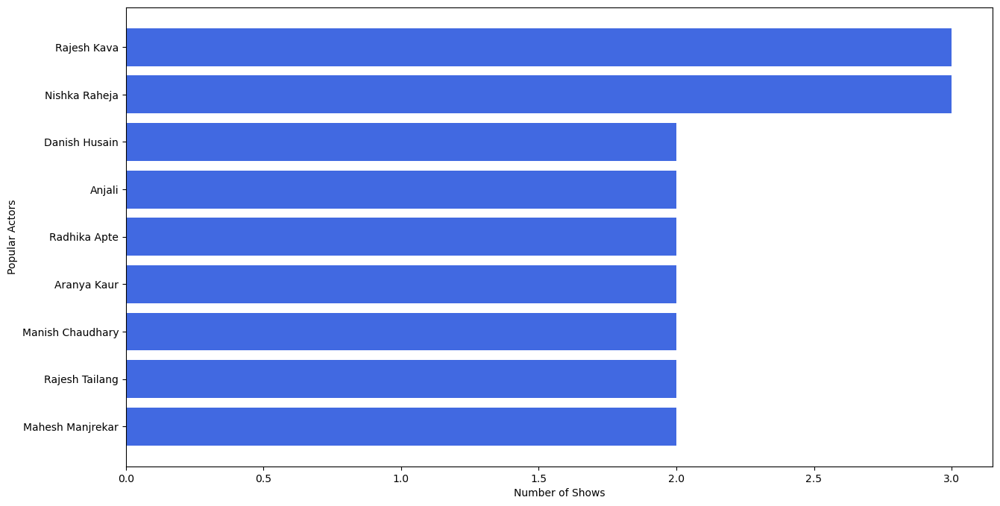

In [116]:
df_actors=df_india_shows.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['royalblue'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actors')
plt.show()

In [117]:
df_actors['cast'].values

array(['Rajesh Kava', 'Nishka Raheja', 'Danish Husain', 'Anjali',
       'Radhika Apte', 'Aranya Kaur', 'Manish Chaudhary',
       'Rajesh Tailang', 'Mahesh Manjrekar'], dtype=object)

## Popular Actors in TV Shows in India are:-
<br>
'Rajesh Kava',
<br>
'Nishka Raheja',
<br>
'Prakash Raj',
<br>
'Sabina Malik',
<br>
'Anjali',
<br>
'Aranya Kaur',
<br>
'Sonal Kaushal',
<br>
'Chandan Anand',
<br>
'Danish Husain'

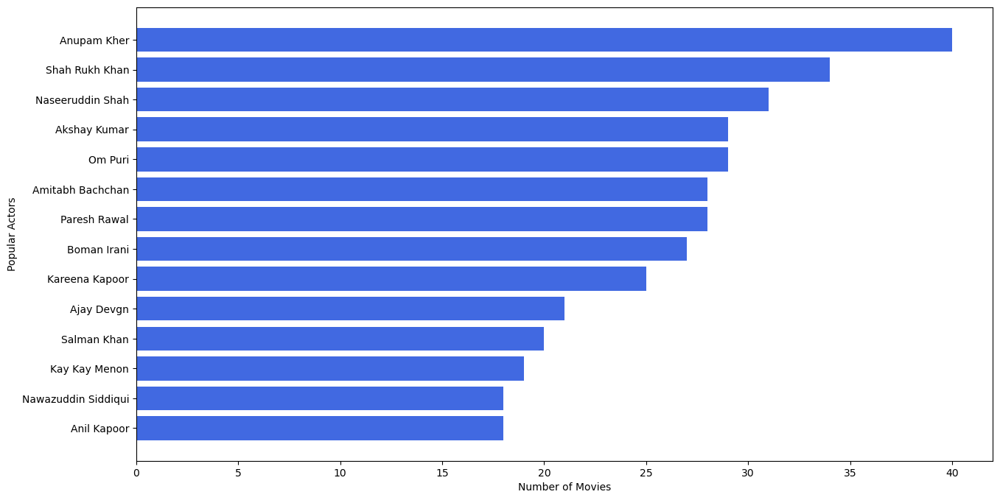

In [118]:
df_actors=df_india_movies.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['royalblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actors')
plt.show()

In [119]:
df_actors['cast'].values

array(['Anupam Kher', 'Shah Rukh Khan', 'Naseeruddin Shah',
       'Akshay Kumar', 'Om Puri', 'Amitabh Bachchan', 'Paresh Rawal',
       'Boman Irani', 'Kareena Kapoor', 'Ajay Devgn', 'Salman Khan',
       'Kay Kay Menon', 'Nawazuddin Siddiqui', 'Anil Kapoor'],
      dtype=object)

## Popular actors across Movies in India:-
<br>
'Anupam Kher',
<br>
'Shah Rukh Khan',
<br>
'Naseeruddin Shah',
<br>
'Akshay Kumar',
<br>
'Om Puri',
<br>
'Paresh Rawal',
<br>
'Julie Tejwani',
<br>
'Amitabh Bachchan',
<br>
'Boman Irani',
<br>
'Rupa Bhimani',
<br>
'Kareena Kapoor',
<br>
'Ajay Devgn',
<br>
'Rajesh Kava',
<br>
'Kay Kay Menon'

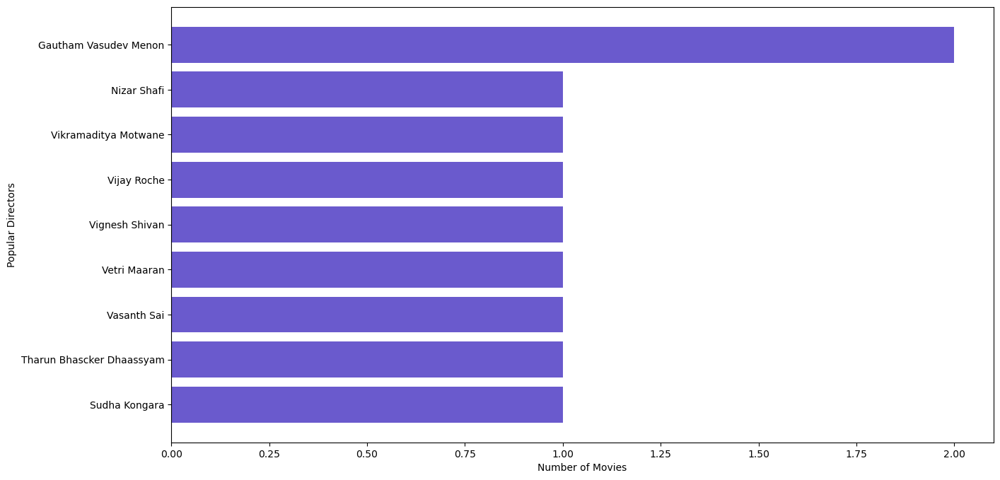

In [120]:
df_directors=df_india_shows.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['slateblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

In [121]:
df_directors['director'].values

array(['Gautham Vasudev Menon', 'Nizar Shafi', 'Vikramaditya Motwane',
       'Vijay Roche', 'Vignesh Shivan', 'Vetri Maaran', 'Vasanth Sai',
       'Tharun Bhascker Dhaassyam', 'Sudha Kongara'], dtype=object)

## Popular Directors Across Movies in India:-
<br>
'Gautham Vasudev Menon',
<br>
'Abhishek Chaubey',
<br>
'Sudha Kongara',
<br>
'Rathindran R Prasad',
<br>
'Sankalp Reddy',
<br>
'Sarjun',
<br>
'Soumendra Padhi',
<br>
'Srijit Mukherji',
<br>
'Tharun Bhascker Dhaassyam'

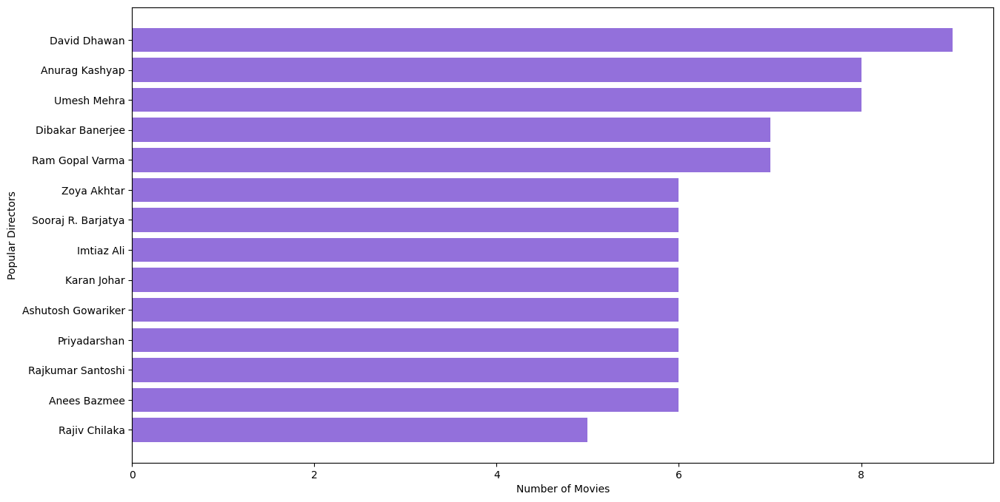

In [122]:
df_directors=df_india_movies.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['mediumpurple'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

In [123]:
df_directors['director'].values

array(['David Dhawan', 'Anurag Kashyap', 'Umesh Mehra',
       'Dibakar Banerjee', 'Ram Gopal Varma', 'Zoya Akhtar',
       'Sooraj R. Barjatya', 'Imtiaz Ali', 'Karan Johar',
       'Ashutosh Gowariker', 'Priyadarshan', 'Rajkumar Santoshi',
       'Anees Bazmee', 'Rajiv Chilaka'], dtype=object)

## Popular directors across movies in India:-
<br>
'Rajiv Chilaka',
<br>
'Suhas Kadav',
<br>
'David Dhawan',
<br>
'Umesh Mehra',
<br>
'Anurag Kashyap',
<br>
'Ram Gopal Varma',
<br>
'Dibakar Banerjee',
<br>
'Zoya Akhtar',
<br>
'Tilak Shetty',
<br>
'Rajkumar Santoshi',
<br>
'Priyadarshan',
<br>
'Sooraj R. Barjatya',
<br>
'Ashutosh Gowariker',
<br>
'Milan Luthria'

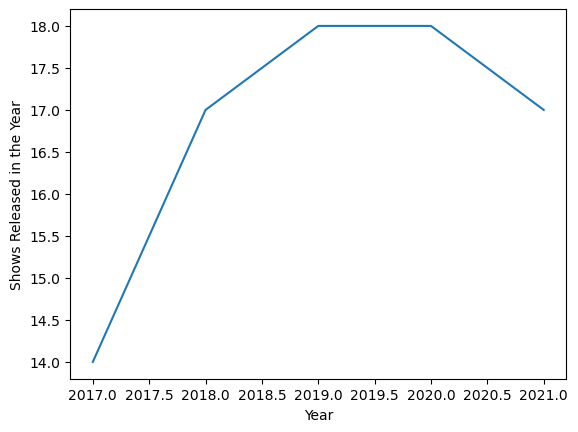

In [124]:
df_year=df_india_shows.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Shows Released in the Year")
plt.xlabel("Year")
plt.show()


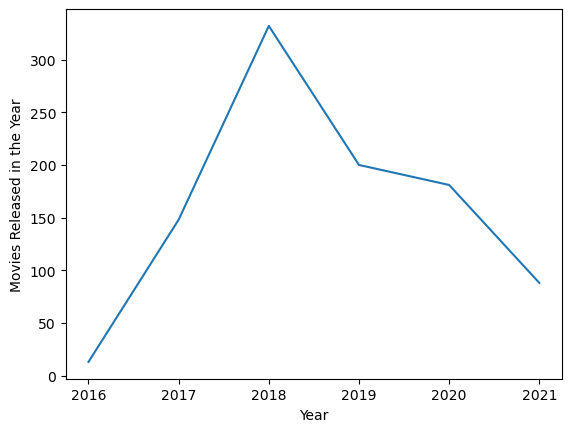

In [125]:
df_year=df_india_movies.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel("Year")
plt.show()

In India,TV Shows were increasingly being added till 2020, though the addition of shows reduced in 2021.

In India, Movies were increasingly added till 2018 but it has been a huge downhill since then. Now that's preposterous, since and soemthing has to be recommended to the Netflix Team with regards to that.

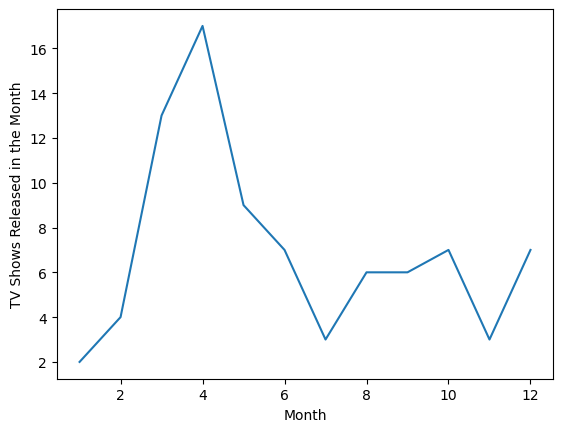

In [126]:
df_month=df_india_shows.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("TV Shows Released in the Month")
plt.xlabel("Month")
plt.show()

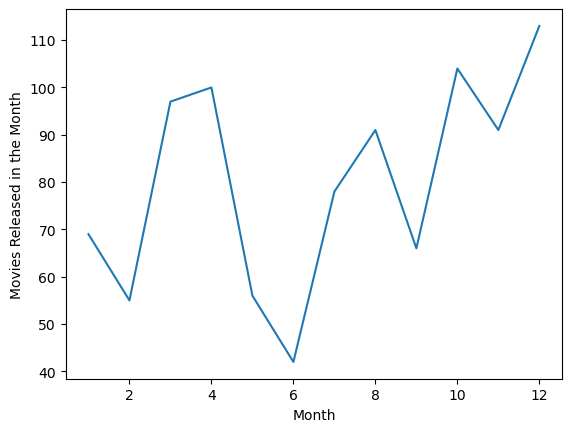

In [127]:
df_month=df_india_movies.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("Movies Released in the Month")
plt.xlabel("Month")
plt.show()

TV Shows are added in Netflix by a tremendous amount in April in India

Movies are added in Netflix in India by a tremendous amount in first week/last month of current year and first month of next year

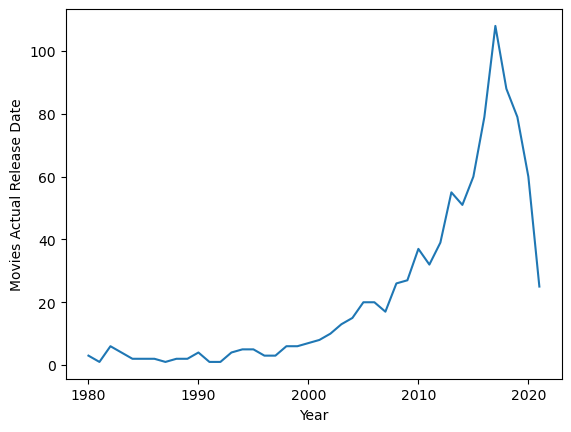

In [128]:
df_release_year=df_india_movies[df_india_movies['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

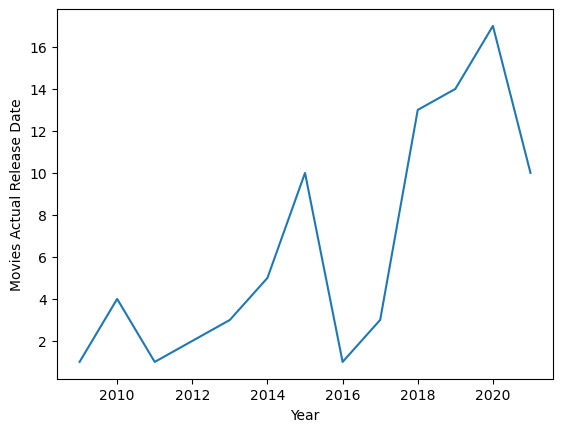

In [129]:
df_release_year=df_india_shows[df_india_shows['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

The understandable trend amongs movies and TV Shows across India in Netflix is the reduction of movies after 2020

In [130]:
#Analysing a combination of actors and directors
df_india_movies['Actor_Director_Combination'] = df_india_movies.cast.str.cat(df_india_movies.director, sep=' and ')
df_india_movies_subset=df_india_movies[df_india_movies['cast']!='unkown_cast']
df_india_movies_subset=df_india_movies_subset[df_india_movies_subset['director']!='unkown_director']
df_india_movies_subset.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
641,Jeans,S. Shankar,Prashanth,India,Comedies,s25,Movie,"September 21, 2021",1998,TV-14,150-200,2021-09-21,9,38,2021,Prashanth and S. Shankar
642,Jeans,S. Shankar,Prashanth,India,International Movies,s25,Movie,"September 21, 2021",1998,TV-14,150-200,2021-09-21,9,38,2021,Prashanth and S. Shankar
643,Jeans,S. Shankar,Prashanth,India,Romantic Movies,s25,Movie,"September 21, 2021",1998,TV-14,150-200,2021-09-21,9,38,2021,Prashanth and S. Shankar
644,Jeans,S. Shankar,Aishwarya Rai Bachchan,India,Comedies,s25,Movie,"September 21, 2021",1998,TV-14,150-200,2021-09-21,9,38,2021,Aishwarya Rai Bachchan and S. Shankar
645,Jeans,S. Shankar,Aishwarya Rai Bachchan,India,International Movies,s25,Movie,"September 21, 2021",1998,TV-14,150-200,2021-09-21,9,38,2021,Aishwarya Rai Bachchan and S. Shankar


In [131]:
df_india_shows['Actor_Director_Combination'] = df_india_shows.cast.str.cat(df_india_shows.director, sep=' and ')
df_india_shows_subset=df_india_shows[df_india_shows['cast']!='unkown_cast']
df_india_shows_subset=df_india_shows_subset[df_india_shows_subset['director']!='unkown_director']
df_india_shows_subset.head()

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
7005,Navarasa,Bejoy Nambiar,Suriya,India,TV Shows,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,2021-08-06,8,31,2021,Suriya and Bejoy Nambiar
7006,Navarasa,Bejoy Nambiar,Vijay Sethupathi,India,TV Shows,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,2021-08-06,8,31,2021,Vijay Sethupathi and Bejoy Nambiar
7007,Navarasa,Bejoy Nambiar,Revathy,India,TV Shows,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,2021-08-06,8,31,2021,Revathy and Bejoy Nambiar
7008,Navarasa,Bejoy Nambiar,Prakash Raj,India,TV Shows,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,2021-08-06,8,31,2021,Prakash Raj and Bejoy Nambiar
7009,Navarasa,Bejoy Nambiar,Siddarth,India,TV Shows,s298,TV Show,"August 6, 2021",2021,TV-MA,1 Season,2021-08-06,8,31,2021,Siddarth and Bejoy Nambiar


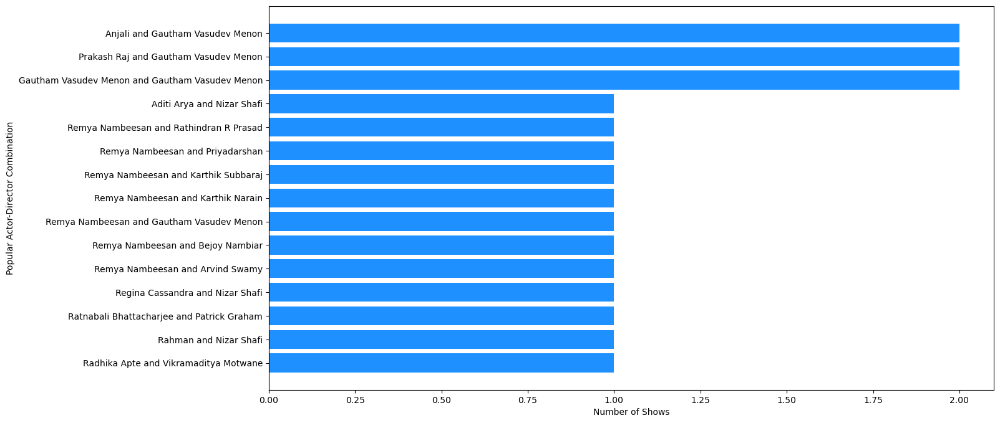

In [132]:
df_actors_directors=df_india_shows_subset.groupby(['Actor_Director_Combination']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_actors_directors[::-1]['Actor_Director_Combination'], df_actors_directors[::-1]['title'],color=['dodgerblue'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actor-Director Combination')
plt.show()

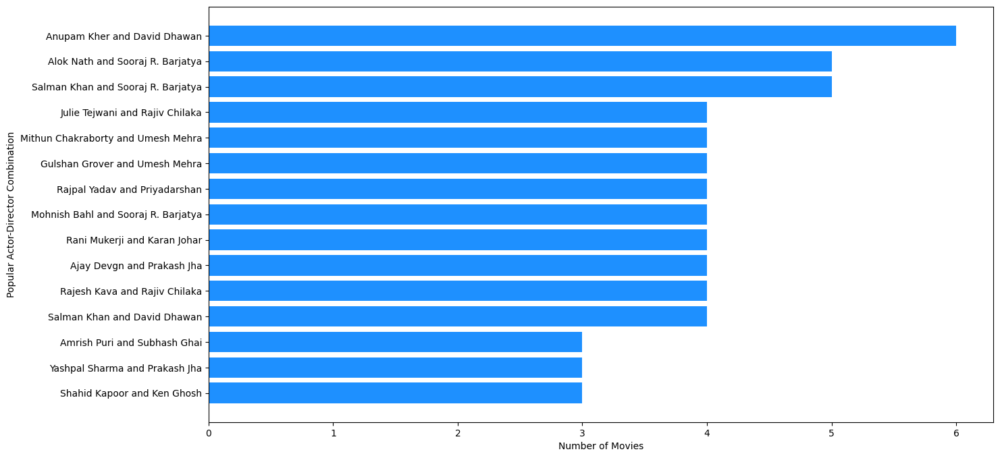

In [133]:
df_actors_directors=df_india_movies_subset.groupby(['Actor_Director_Combination']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_actors_directors[::-1]['Actor_Director_Combination'], df_actors_directors[::-1]['title'],color=['dodgerblue'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actor-Director Combination')
plt.show()

In [134]:
df_india_movies[df_india_movies['director']=='Rajiv Chilaka']

,title,director,cast,country,genre,show_id,type,date_added,release_year,rating,duration,Modified_Added_date,month_added,week_Added,year,Actor_Director_Combination
10086,Chhota Bheem And The Broken Amulet,Rajiv Chilaka,Vatsal Dubey,India,Children & Family Movies,s411,Movie,"July 22, 2021",2013,TV-Y7,50-80,2021-07-22,7,29,2021,Vatsal Dubey and Rajiv Chilaka
10087,Chhota Bheem And The Broken Amulet,Rajiv Chilaka,Julie Tejwani,India,Children & Family Movies,s411,Movie,"July 22, 2021",2013,TV-Y7,50-80,2021-07-22,7,29,2021,Julie Tejwani and Rajiv Chilaka
10088,Chhota Bheem And The Broken Amulet,Rajiv Chilaka,Rupa Bhimani,India,Children & Family Movies,s411,Movie,"July 22, 2021",2013,TV-Y7,50-80,2021-07-22,7,29,2021,Rupa Bhimani and Rajiv Chilaka
10089,Chhota Bheem And The Broken Amulet,Rajiv Chilaka,Jigna Bhardwaj,India,Children & Family Movies,s411,Movie,"July 22, 2021",2013,TV-Y7,50-80,2021-07-22,7,29,2021,Jigna Bhardwaj and Rajiv Chilaka
10090,Chhota Bheem And The Broken Amulet,Rajiv Chilaka,Rajesh Kava,India,Children & Family Movies,s411,Movie,"July 22, 2021",2013,TV-Y7,50-80,2021-07-22,7,29,2021,Rajesh Kava and Rajiv Chilaka
10091,Chhota Bheem And The Broken Amulet,Rajiv Chilaka,Mousam,India,Children & Family Movies,s411,Movie,"July 22, 2021",2013,TV-Y7,50-80,2021-07-22,7,29,2021,Mousam and Rajiv Chilaka
10092,Chhota Bheem And The Broken Amulet,Rajiv Chilaka,Swapnil,India,Children & Family Movies,s411,Movie,"July 22, 2021",2013,TV-Y7,50-80,2021-07-22,7,29,2021,Swapnil and Rajiv Chilaka
10121,Chhota Bheem aur Krishna,Rajiv Chilaka,Vatsal Dubey,India,Children & Family Movies,s416,Movie,"July 22, 2021",2009,TV-Y7,50-80,2021-07-22,7,29,2021,Vatsal Dubey and Rajiv Chilaka
10122,Chhota Bheem aur Krishna,Rajiv Chilaka,Julie Tejwani,India,Children & Family Movies,s416,Movie,"July 22, 2021",2009,TV-Y7,50-80,2021-07-22,7,29,2021,Julie Tejwani and Rajiv Chilaka
10123,Chhota Bheem aur Krishna,Rajiv Chilaka,Rupa Bhimani,India,Children & Family Movies,s416,Movie,"July 22, 2021",2009,TV-Y7,50-80,2021-07-22,7,29,2021,Rupa Bhimani and Rajiv Chilaka


It seems that Rajiv Chilaka has worked on Chota Bheem and has been able to create some good content in its movies. He can be relied on for more Chota Bheem stories

In [135]:
df_actors_directors['Actor_Director_Combination'].values

array(['Anupam Kher and David Dhawan', 'Alok Nath and Sooraj R. Barjatya',
       'Salman Khan and Sooraj R. Barjatya',
       'Julie Tejwani and Rajiv Chilaka',
       'Mithun Chakraborty and Umesh Mehra',
       'Gulshan Grover and Umesh Mehra', 'Rajpal Yadav and Priyadarshan',
       'Mohnish Bahl and Sooraj R. Barjatya',
       'Rani Mukerji and Karan Johar', 'Ajay Devgn and Prakash Jha',
       'Rajesh Kava and Rajiv Chilaka', 'Salman Khan and David Dhawan',
       'Amrish Puri and Subhash Ghai', 'Yashpal Sharma and Prakash Jha',
       'Shahid Kapoor and Ken Ghosh'], dtype=object)

## The Most Popular Actor Director Combination in Movies Across India are:-
<br>
'Rajesh Kava and Rajiv Chilaka',
<br>
'Julie Tejwani and Rajiv Chilaka',
<br>
'Rupa Bhimani and Rajiv Chilaka',
<br>
'Jigna Bhardwaj and Rajiv Chilaka',
<br>
'Vatsal Dubey and Rajiv Chilaka',
<br>
'Mousam and Rajiv Chilaka',
<br>
'Swapnil and Rajiv Chilaka',
<br>
'Saurav Chakraborty and Suhas Kadav',
<br>
'Smita Malhotra and Tilak Shetty',
<br>
'Anupam Kher and David Dhawan',
<br>
'Salman Khan and Sooraj R. Barjatya',

## Univariate Analysis separately for shows and movies in United Kingdom

In [136]:
#Analyzing India for both shows and movies
df_uk_shows=df_final1[df_final1['country']=='United Kingdom'][df_final1[df_final1['country']=='United Kingdom']['type']=='TV Show']
df_uk_movies=df_final1[df_final1['country']=='United Kingdom'][df_final1[df_final1['country']=='United Kingdom']['type']=='Movie']

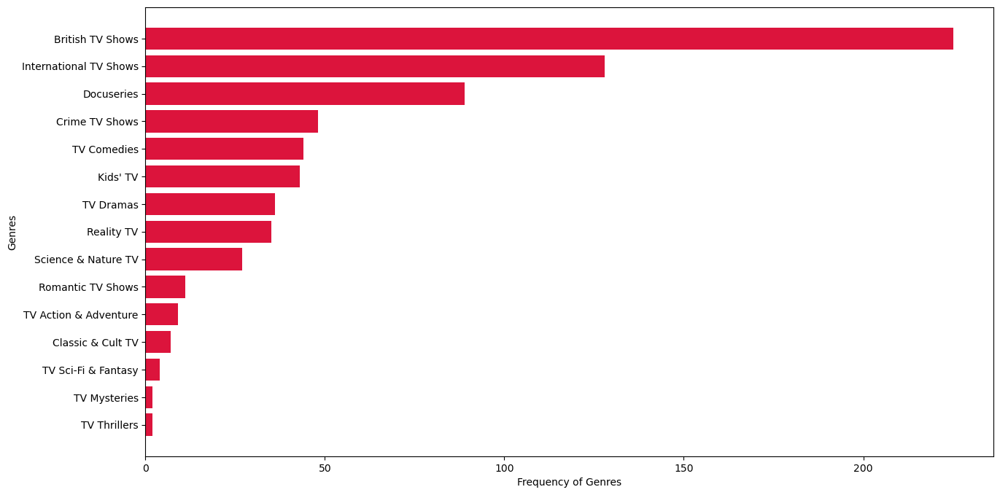

In [137]:
df_genre=df_uk_shows.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['crimson'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

British TV Shows,International TV Shows,Docuseries, Crime, Comedy are widely watched Genres in TV Shows in UK

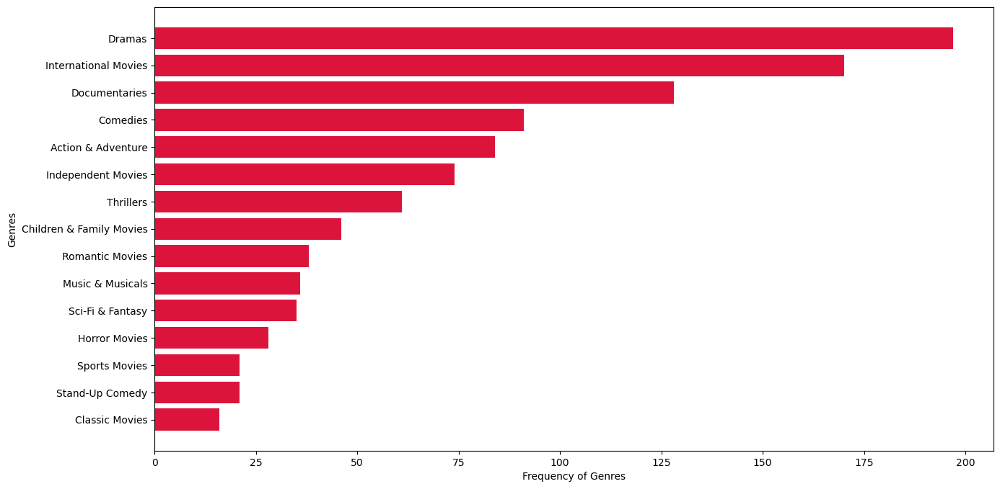

In [138]:
df_genre=df_uk_movies.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['crimson'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

International Movies,Drama,Comedy,Indpeendent Movies and Action, Romance Genres in Movies are prevalent in UK

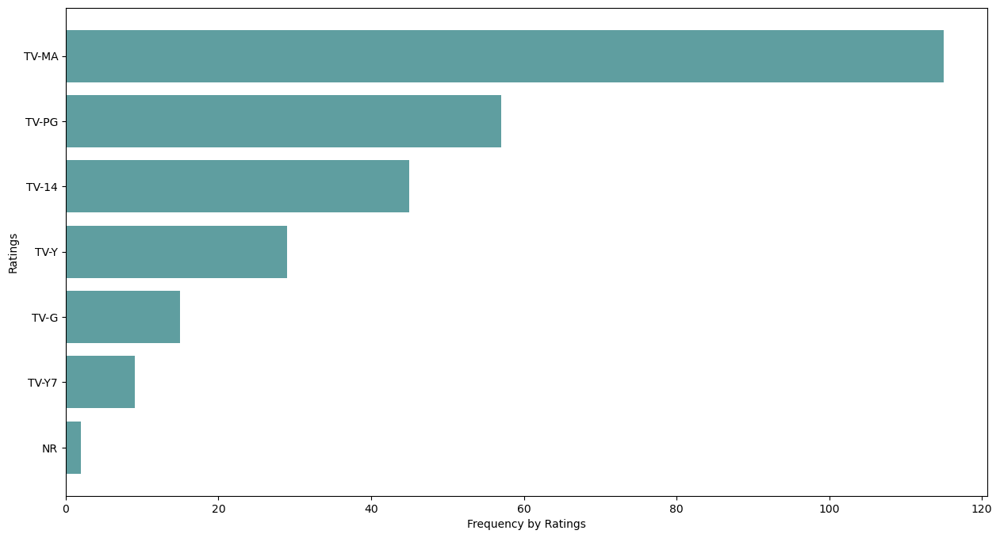

In [139]:
df_rating=df_uk_shows.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['cadetblue'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

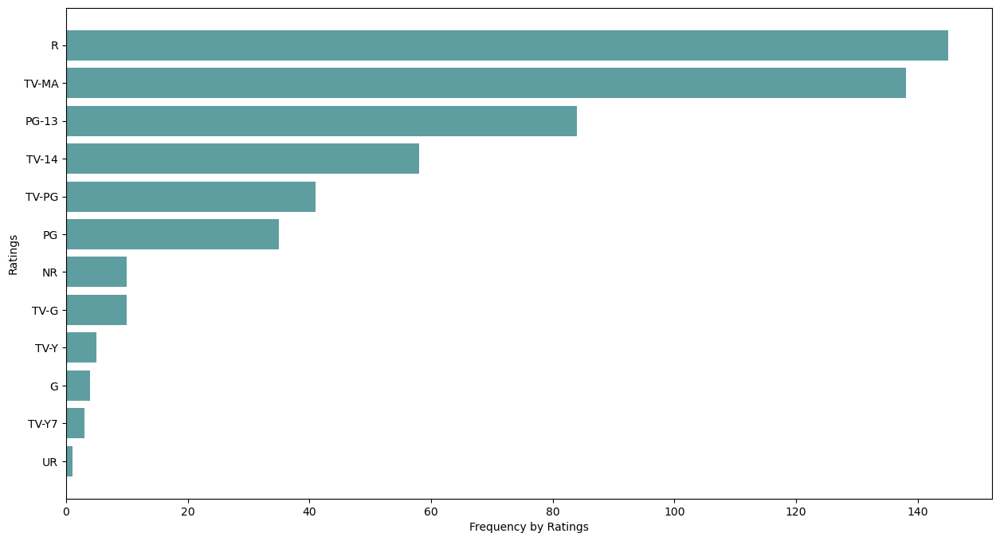

In [140]:
df_rating=df_uk_movies.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['cadetblue'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

So it seems plaussible to conclude that the popular ratings across Netflix includes Parental Guidance and Mature Audiences in TV Shows and R Rated+MA Rated in Movies in UK

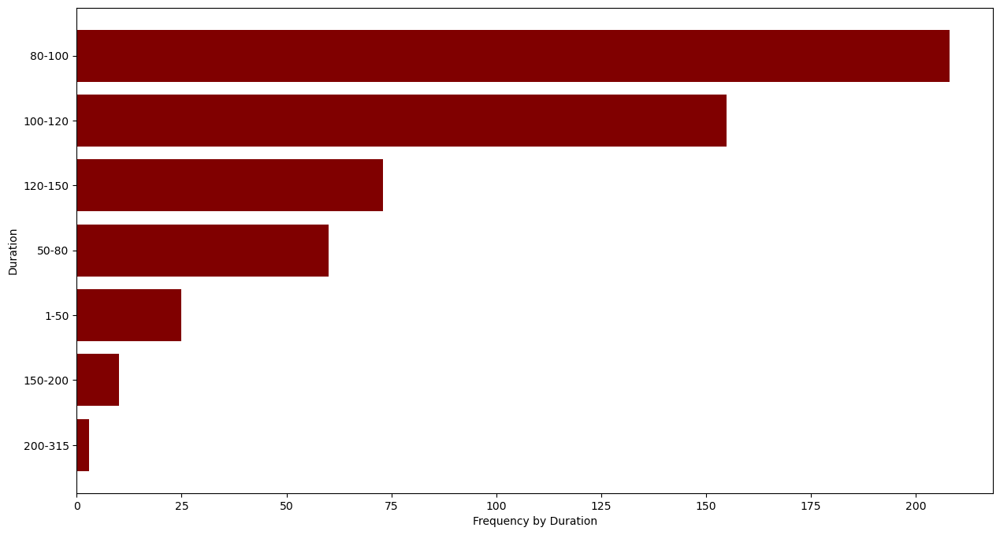

In [141]:
df_duration=df_uk_movies.groupby(['duration']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,8))
plt.barh(df_duration[::-1]['duration'], df_duration[::-1]['title'],color=['maroon'])
plt.xlabel('Frequency by Duration')
plt.ylabel('Duration')
plt.show()

Across movies ranges of minutes in UK have a sweet spot at 80-120 mins.

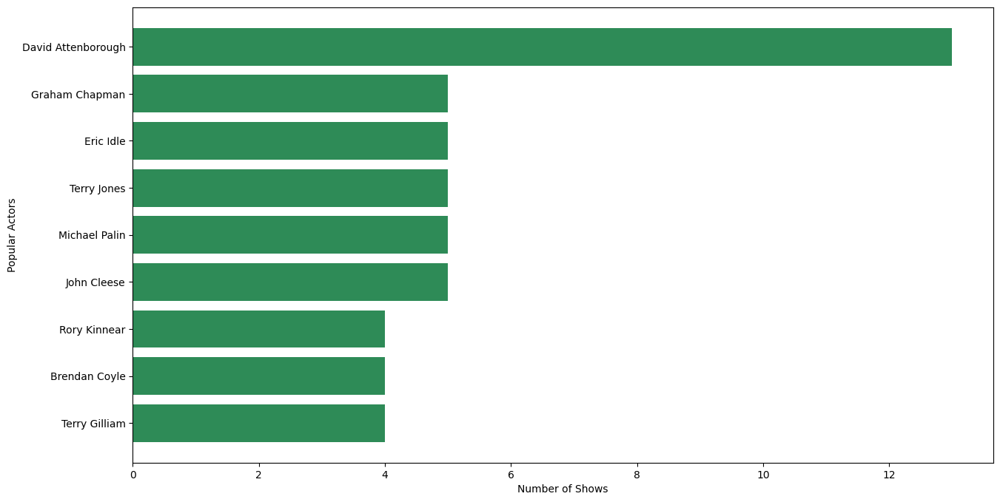

In [142]:
df_actors=df_uk_shows.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['seagreen'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actors')
plt.show()

In [143]:
df_actors['cast'].values

array(['David Attenborough', 'Graham Chapman', 'Eric Idle', 'Terry Jones',
       'Michael Palin', 'John Cleese', 'Rory Kinnear', 'Brendan Coyle',
       'Terry Gilliam'], dtype=object)

## Popular Actors in TV Shows in UK are
<br>
'David Attenborough',
<br>
'Terry Jones',
<br>
'Graham Chapman',
<br>
'John Cleese',
<br>
'Eric Idle',
<br>
'Michael Palin',
<br>
'Terry Gilliam',
<br>
'Teresa Gallagher',
<br>
'Harriet Walter'

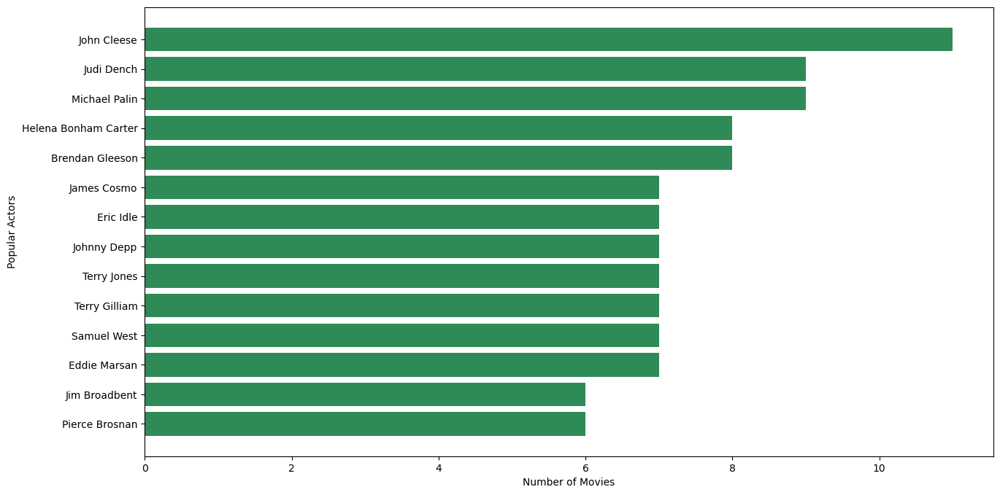

In [144]:
df_actors=df_uk_movies.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['seagreen'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Actors')
plt.show()

In [145]:
df_actors['cast'].values

array(['John Cleese', 'Judi Dench', 'Michael Palin',
       'Helena Bonham Carter', 'Brendan Gleeson', 'James Cosmo',
       'Eric Idle', 'Johnny Depp', 'Terry Jones', 'Terry Gilliam',
       'Samuel West', 'Eddie Marsan', 'Jim Broadbent', 'Pierce Brosnan'],
      dtype=object)

## Popular actors across Movies in UK
<br>
'John Cleese',
<br>
'Michael Palin',
<br>
'Judi Dench',
<br>
'Keith Wickham',
<br>
'Eric Idle',
<br>
'Brendan Gleeson',
<br>
'Terry Gilliam',
<br>
'Terry Jones',
<br>
'Helena Bonham Carter',
<br>
'Graham Chapman',
<br>
'Samuel West',
<br>
'Eddie Marsan',
<br>
'James Cosmo',
<br>
'Rob Rackstraw'


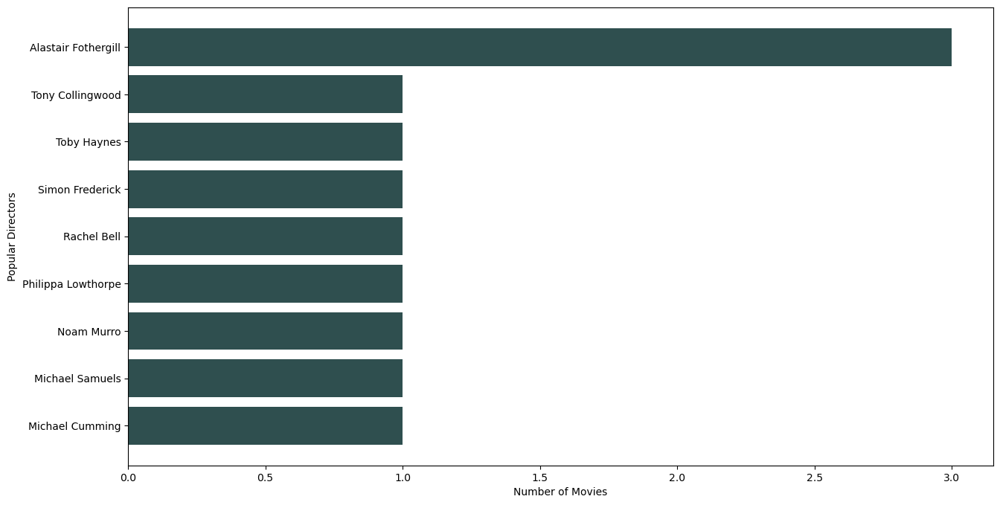

In [146]:
df_directors=df_uk_shows.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['darkslategrey'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

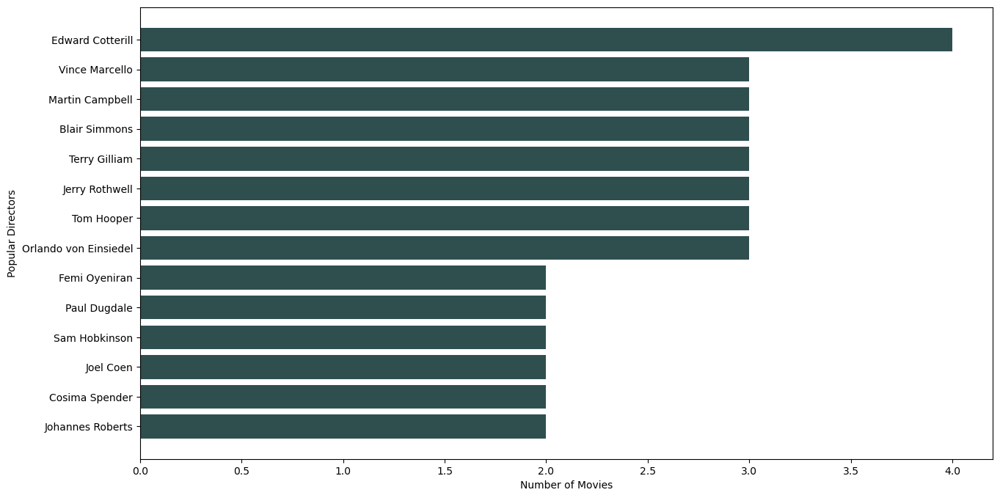

In [147]:
df_directors=df_uk_movies.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['darkslategrey'])
plt.xlabel('Number of Movies')
plt.ylabel('Popular Directors')
plt.show()

In [148]:
df_directors['director'].values

array(['Edward Cotterill', 'Vince Marcello', 'Martin Campbell',
       'Blair Simmons', 'Terry Gilliam', 'Jerry Rothwell', 'Tom Hooper',
       'Orlando von Einsiedel', 'Femi Oyeniran', 'Paul Dugdale',
       'Sam Hobkinson', 'Joel Coen', 'Cosima Spender', 'Johannes Roberts'],
      dtype=object)

## Popular directors across movies in UK
<br>
'Vince Marcello'
<br>
'Edward Cotterill'


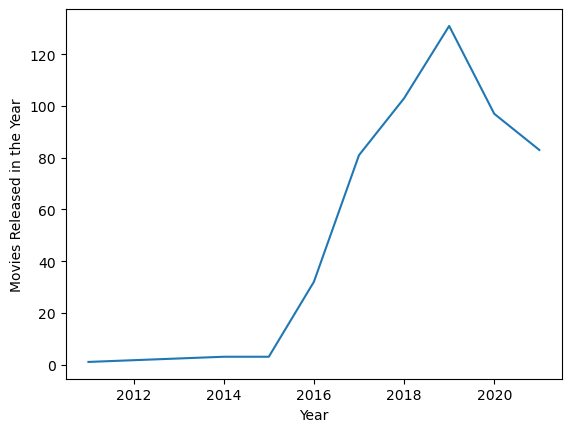

In [149]:
df_year=df_uk_movies.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel("Year")
plt.show()

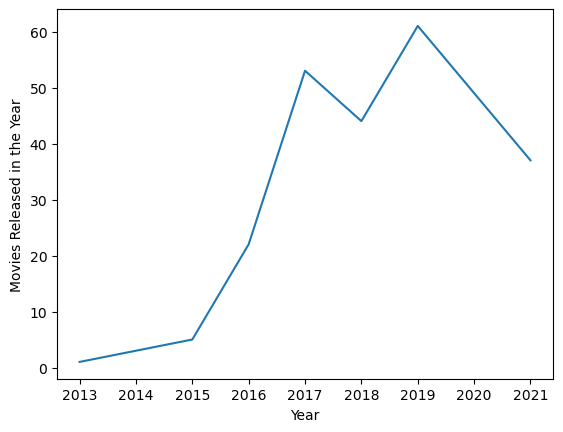

In [150]:
df_year=df_uk_shows.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel("Year")
plt.show()

In terms of TV Shows, UK saw a downfall in 2018 from 2017, then a great increase in 2019 but has been reducing since then.

In terms of Movies,the number of popular movies in UK increased till 2019, since then it's decreasing.

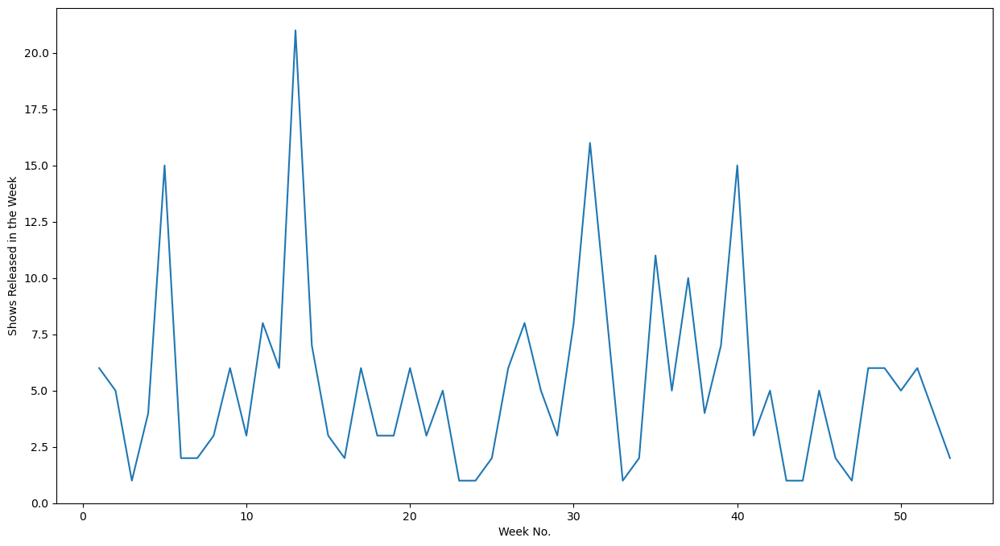

In [151]:
df_week=df_uk_shows.groupby(['week_Added']).agg({"title":"nunique"}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week, x='week_Added', y='title')
plt.ylabel("Shows Released in the Week")
plt.xlabel("Week No.")
plt.show()

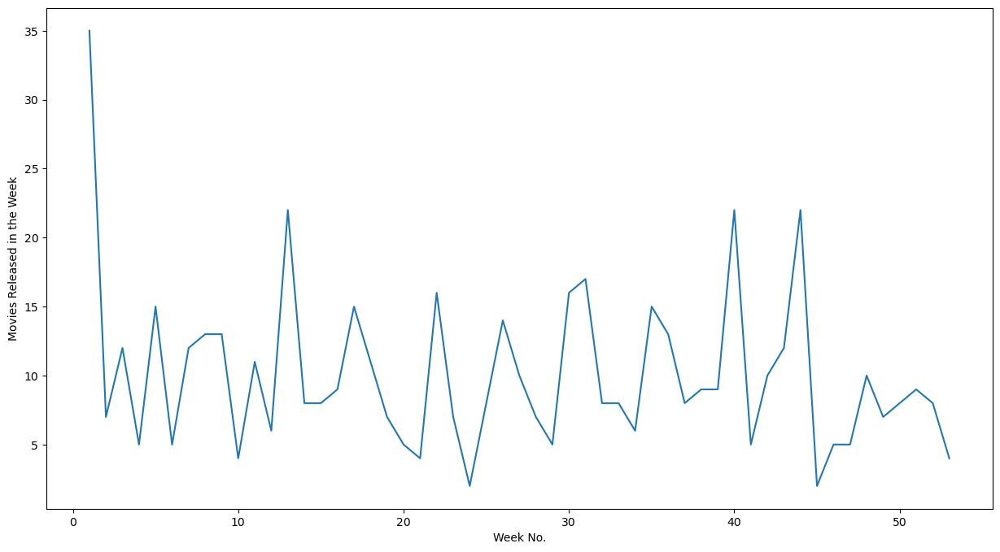

In [152]:
df_week=df_uk_movies.groupby(['week_Added']).agg({"title":"nunique"}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week, x='week_Added', y='title')
plt.ylabel("Movies Released in the Week")
plt.xlabel("Week No.")
plt.show()

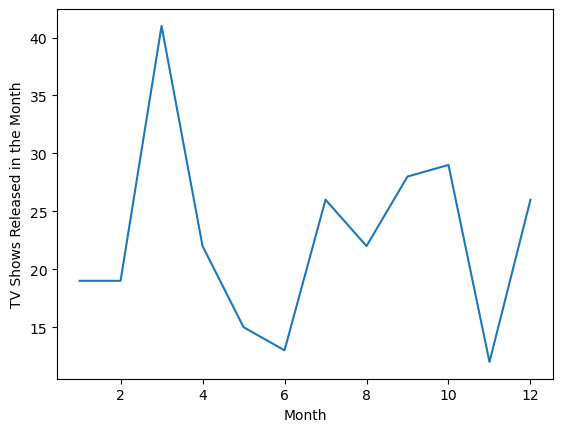

In [153]:
df_month=df_uk_shows.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("TV Shows Released in the Month")
plt.xlabel("Month")
plt.show()

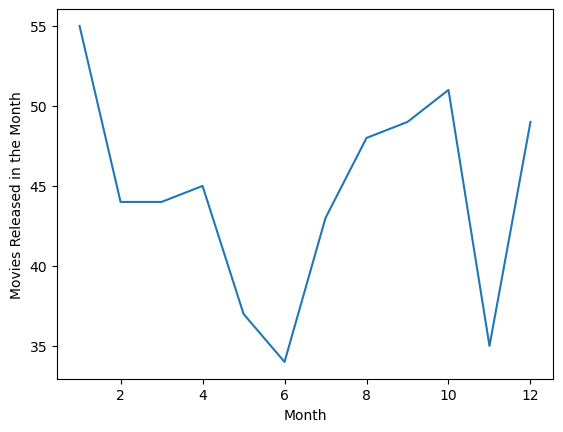

In [154]:
df_month=df_uk_movies.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("Movies Released in the Month")
plt.xlabel("Month")
plt.show()

TV Shows are added in Netflix by a tremendous amount in March in UK

Movies are added in Netflix in India by a tremendous amount in first week/last month of current year and first month of next year

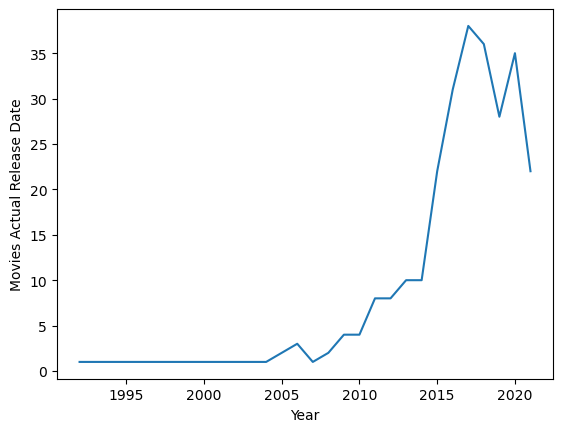

In [155]:
df_release_year=df_uk_shows[df_uk_shows['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

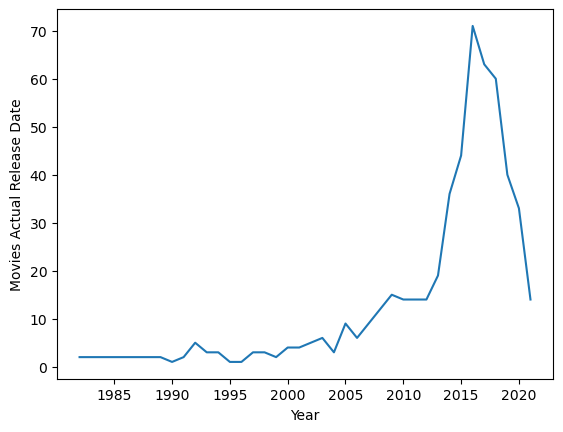

In [156]:
df_release_year=df_uk_movies[df_uk_movies['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

Same trend of reduction in movies and shows after 2020.

## Univariate Analysis separately for shows in Japan

In [157]:
#Analyzing India for both shows and movies
df_japan_shows=df_final1[df_final1['country']=='Japan'][df_final1[df_final1['country']=='Japan']['type']=='TV Show']

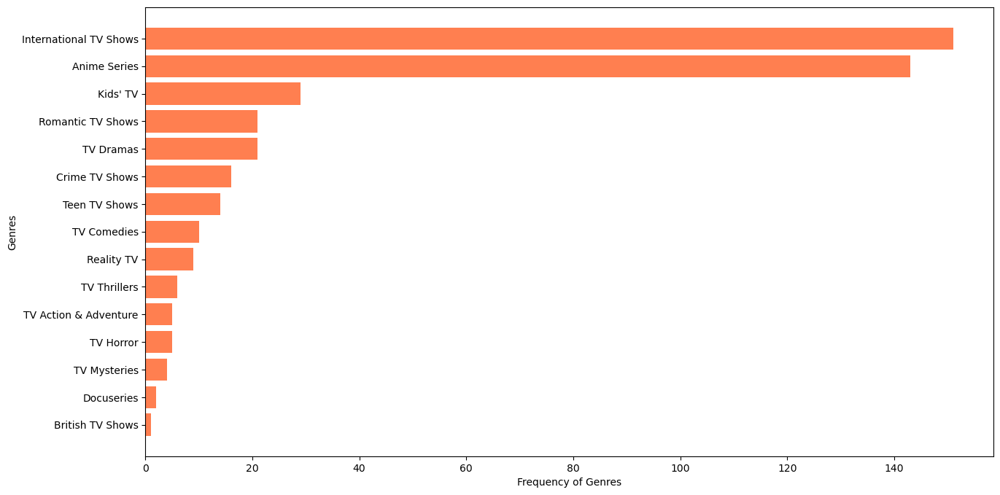

In [158]:
df_genre=df_japan_shows.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['coral'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

International TV Shows and Anime Genres are popular in TV Shows in Japan

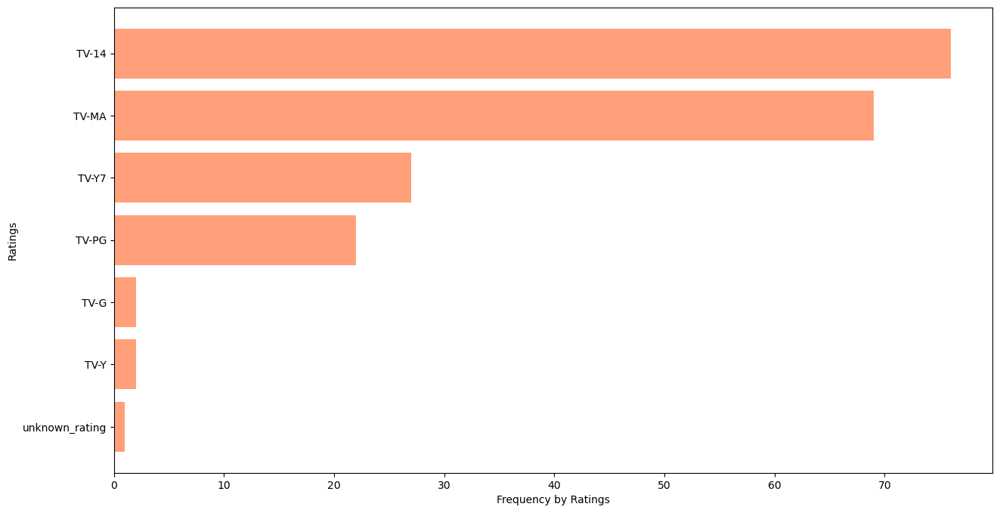

In [159]:
df_rating=df_japan_shows.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['lightsalmon'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

So it seems plaussible to conclude that the popular ratings across Netflix includes TV-14 Mature Audiences in TV Shows

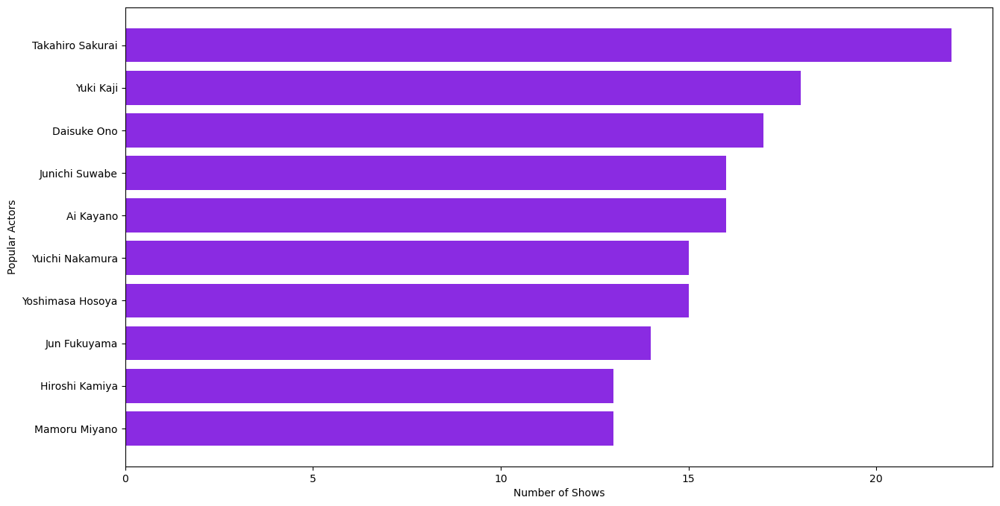

In [160]:
df_actors=df_japan_shows.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['blueviolet'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actors')
plt.show()

In [161]:
df_actors['cast'].values

array(['Takahiro Sakurai', 'Yuki Kaji', 'Daisuke Ono', 'Junichi Suwabe',
       'Ai Kayano', 'Yuichi Nakamura', 'Yoshimasa Hosoya', 'Jun Fukuyama',
       'Hiroshi Kamiya', 'Mamoru Miyano'], dtype=object)

## Popular Actors in TV Shows in Japan are
<br>
'Takahiro Sakurai',
<br>
'Yuki Kaji',
<br>
'Daisuke Ono',
<br>
'Junichi Suwabe',
<br>
'Ai Kayano',
<br>
'Yuichi Nakamura',
<br>
'Yoshimasa Hosoya',
<br>
'Jun Fukuyama',
<br>
'Hiroshi Kamiya',
<br>
'Kana Hanazawa'

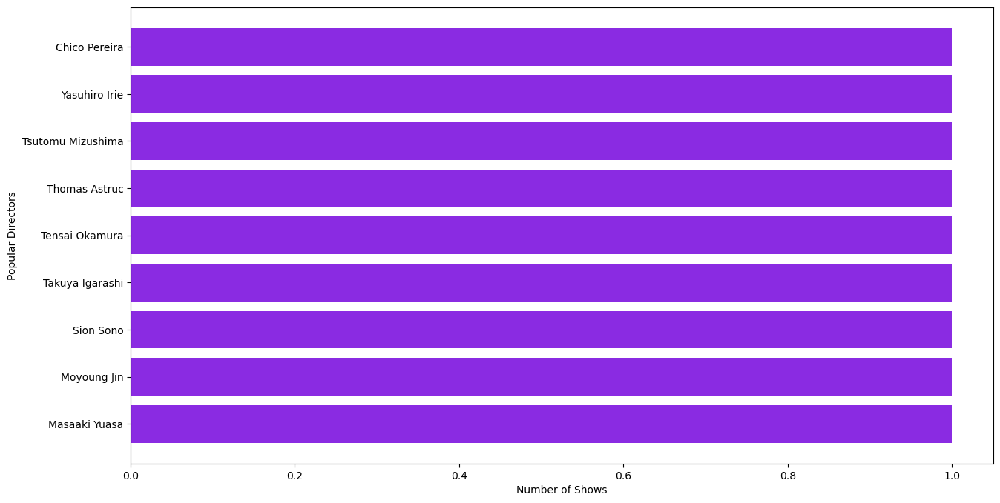

In [162]:
df_directors=df_japan_shows.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['blueviolet'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Directors')
plt.show()

In [163]:
df_directors['director'].values

array(['Chico Pereira', 'Yasuhiro Irie', 'Tsutomu Mizushima',
       'Thomas Astruc', 'Tensai Okamura', 'Takuya Igarashi', 'Sion Sono',
       'Moyoung Jin', 'Masaaki Yuasa'], dtype=object)

## All Directors are one time directors only

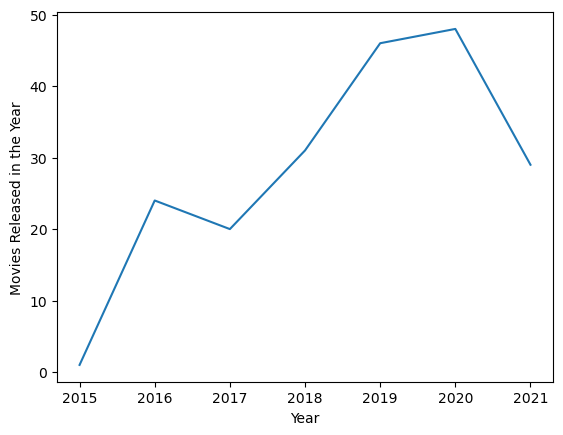

In [164]:
df_year=df_japan_shows.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel("Year")
plt.show()

In Japan, TV Shows have diminished in 2017 from 2016 and then increased till 2020 after which it has reduced in 2021.

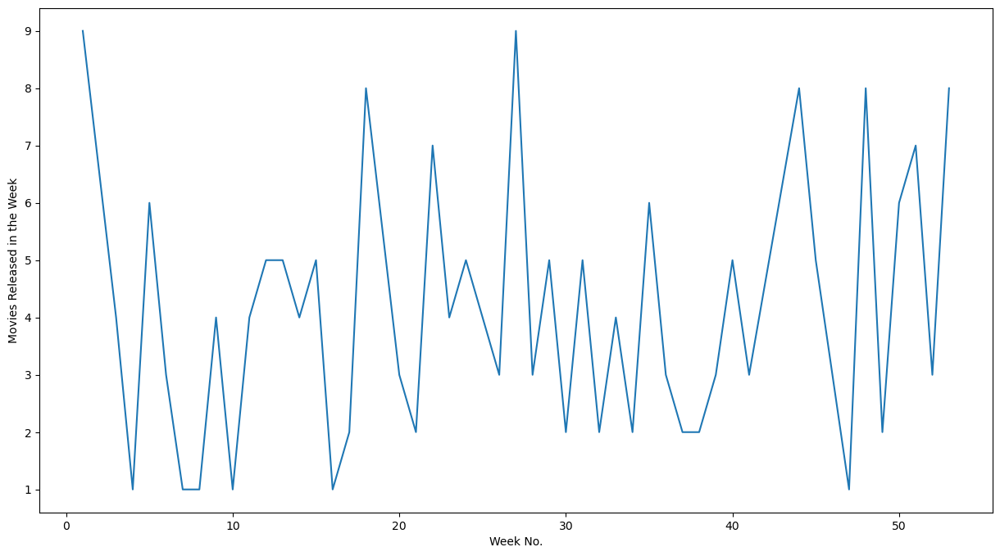

In [165]:
df_week=df_japan_shows.groupby(['week_Added']).agg({"title":"nunique"}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week, x='week_Added', y='title')
plt.ylabel("Movies Released in the Week")
plt.xlabel("Week No.")
plt.show()

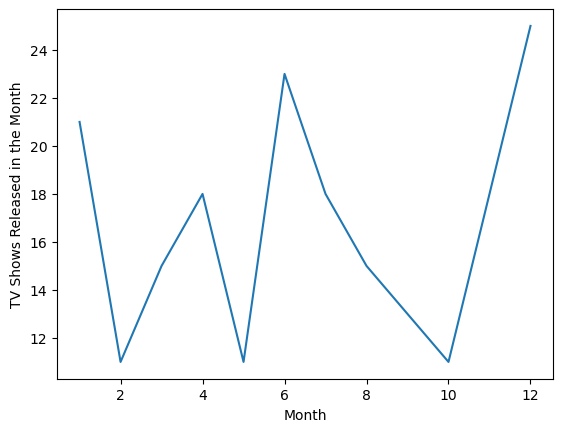

In [166]:
df_month=df_japan_shows.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("TV Shows Released in the Month")
plt.xlabel("Month")
plt.show()

TV Shows are added in Netflix by significant numbers in April and January in Japan

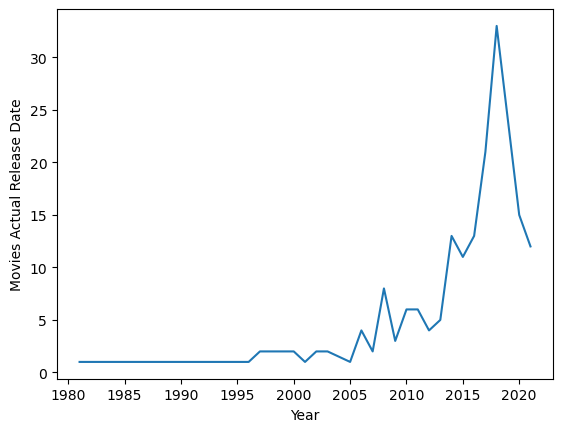

In [167]:
df_release_year=df_japan_shows[df_japan_shows['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

Reduction in TV Shows after 2019 in Japan

 ### Univariate Analysis separately for shows in South Korea

In [168]:
#Analyzing India for both shows and movies
df_sk_shows=df_final1[df_final1['country']=='South Korea'][df_final1[df_final1['country']=='South Korea']['type']=='TV Show']

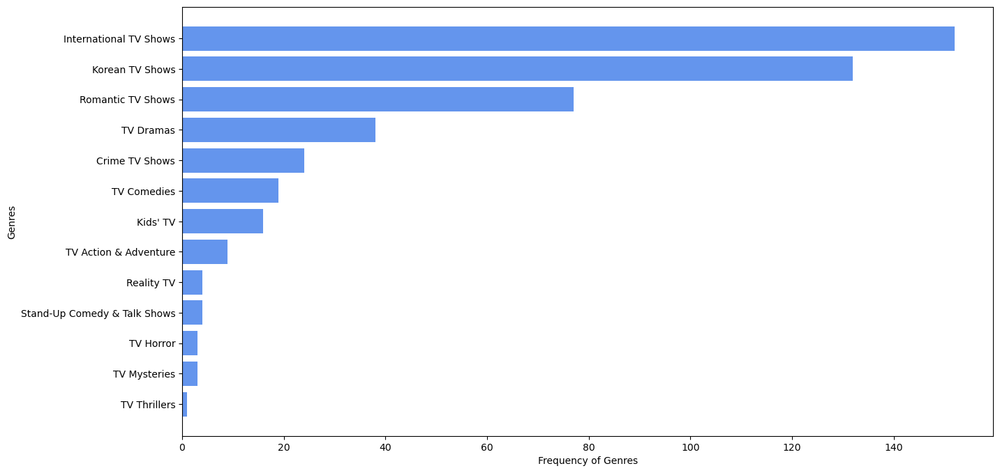

In [169]:
df_genre=df_sk_shows.groupby(['genre']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_genre[::-1]['genre'], df_genre[::-1]['title'],color=['cornflowerblue'])
plt.xlabel('Frequency of Genres')
plt.ylabel('Genres')
plt.show()

International TV Shows,Romantic TV Shows,Drama,Crime and Comedy Genres are popular in TV Shows in S.Korea.

Only S.Korea has Romance as a top 3 favorable genre which depicts an inclination of their audience

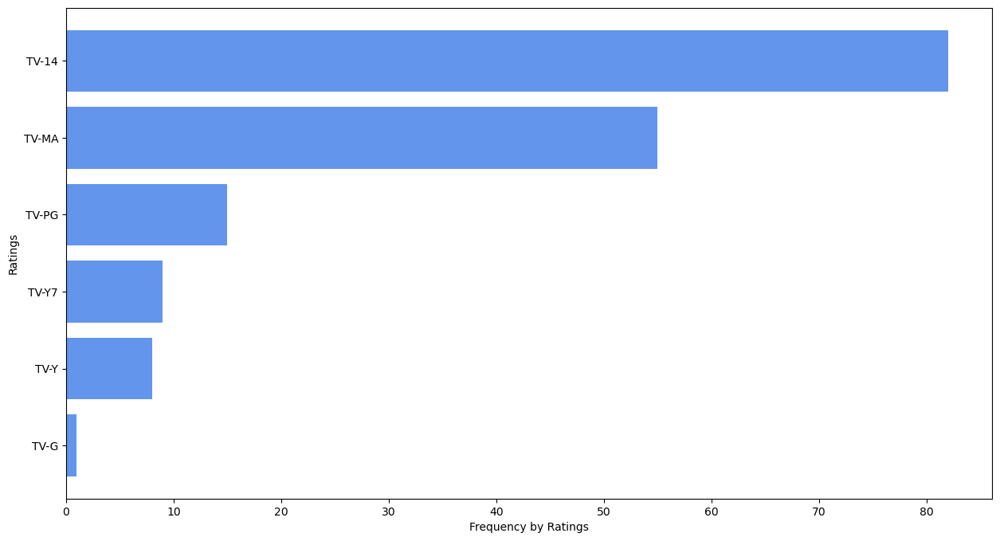

In [170]:
df_rating=df_sk_shows.groupby(['rating']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:15]
plt.figure(figsize=(15,8))
plt.barh(df_rating[::-1]['rating'], df_rating[::-1]['title'],color=['cornflowerblue'])
plt.xlabel('Frequency by Ratings')
plt.ylabel('Ratings')
plt.show()

So it seems plaussible to conclude that the popular ratings across Netflix includes TV-14 and Mature Audiences in TV Shows

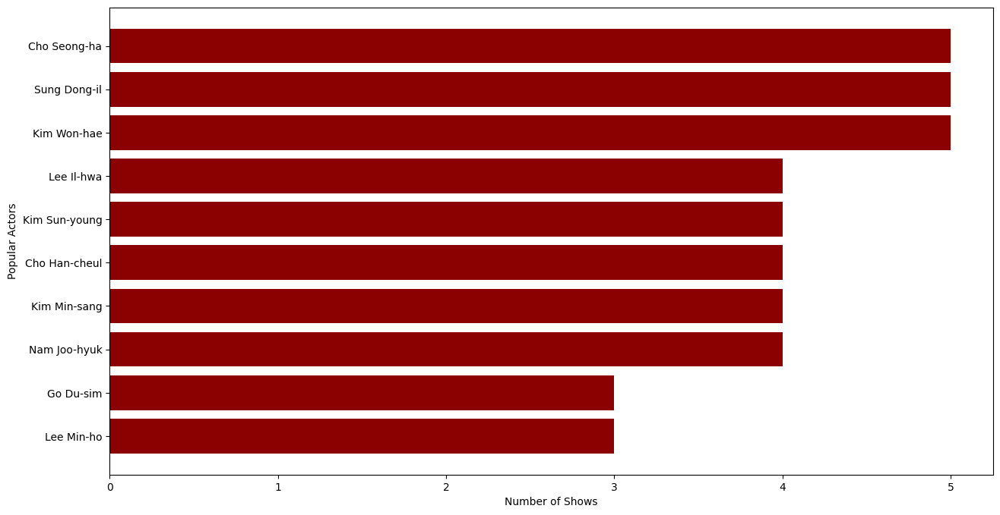

In [171]:
df_actors=df_sk_shows.groupby(['cast']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_actors=df_actors[df_actors['cast']!='unkown_cast']
plt.figure(figsize=(15,8))
plt.barh(df_actors[::-1]['cast'], df_actors[::-1]['title'],color=['darkred'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Actors')
plt.show()

In [172]:
df_actors['cast'].values

array(['Cho Seong-ha', 'Sung Dong-il', 'Kim Won-hae', 'Lee Il-hwa',
       'Kim Sun-young', 'Cho Han-cheul', 'Kim Min-sang', 'Nam Joo-hyuk',
       'Go Du-sim', 'Lee Min-ho'], dtype=object)

## Popular Actors in TV Shows in South Korea are
<br>
'Sung Dong-il',
<br>
'Kim Won-hae',
<br>
'Cho Seong-ha',
<br>
'Nam Joo-hyuk'


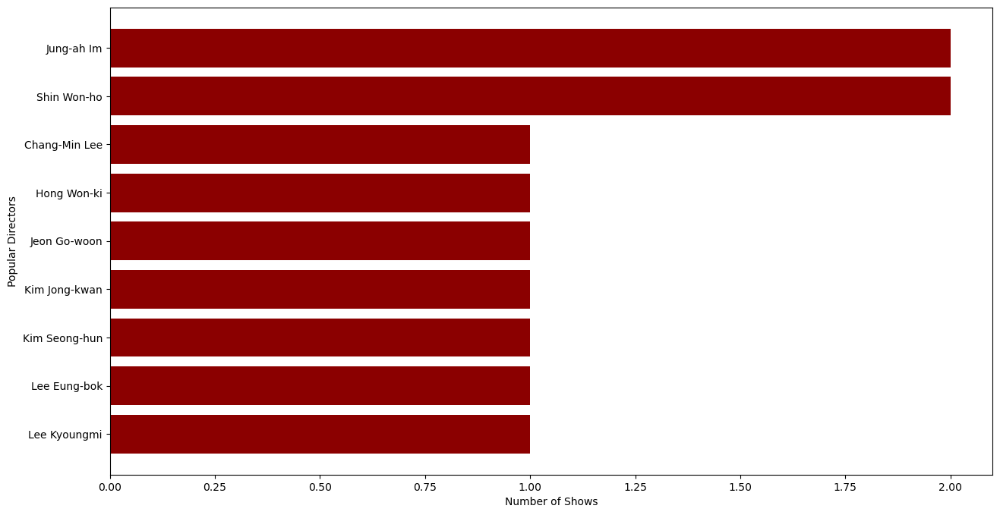

In [173]:
df_directors=df_sk_shows.groupby(['director']).agg({"title":"nunique"}).reset_index().sort_values(by=['title'],ascending=False)[:10]
df_directors=df_directors[df_directors['director']!='unkown_director']
plt.figure(figsize=(15,8))
plt.barh(df_directors[::-1]['director'], df_directors[::-1]['title'],color=['darkred'])
plt.xlabel('Number of Shows')
plt.ylabel('Popular Directors')
plt.show()

## Two directors have directed 2 shows and rest all Directors are one time directors only

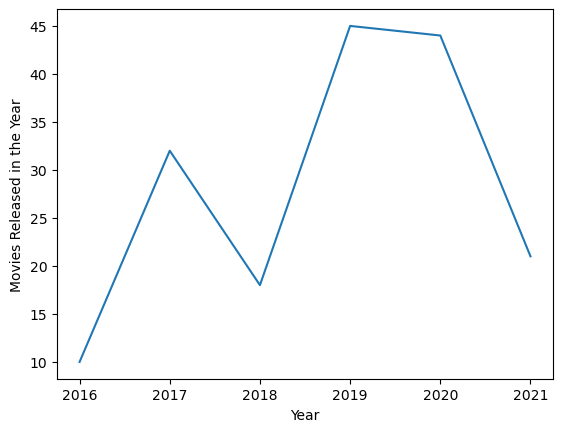

In [174]:
df_year=df_sk_shows.groupby(['year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_year, x='year', y='title')
plt.ylabel("Movies Released in the Year")
plt.xlabel("Year")
plt.show()

In South Korea, number of TV Shows reduced in 2018 from 2017, then increased till 2019 but have been on a heavy downfall since then

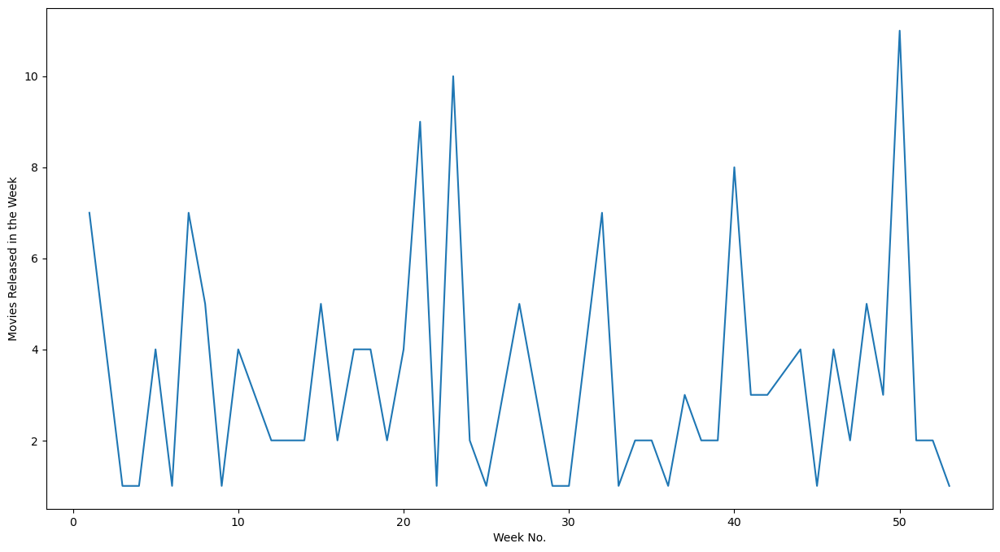

In [175]:
df_week=df_sk_shows.groupby(['week_Added']).agg({"title":"nunique"}).reset_index()
plt.figure(figsize=(15,8))
sns.lineplot(data=df_week, x='week_Added', y='title')
plt.ylabel("Movies Released in the Week")
plt.xlabel("Week No.")
plt.show()

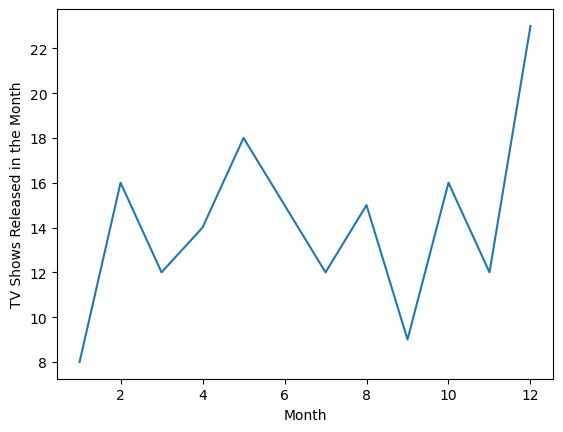

In [176]:
df_month=df_sk_shows.groupby(['month_added']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_month, x='month_added', y='title')
plt.ylabel("TV Shows Released in the Month")
plt.xlabel("Month")
plt.show()

TV Shows are added in Netflix by significant numbers in May and January in South Korea

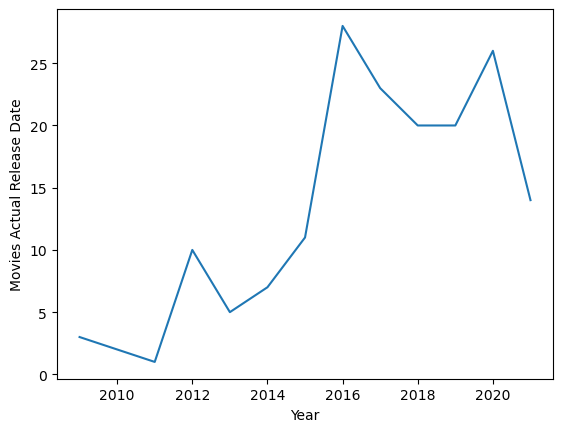

In [177]:
df_release_year=df_sk_shows[df_sk_shows['release_year']>=1980].groupby(['release_year']).agg({"title":"nunique"}).reset_index()
sns.lineplot(data=df_release_year, x='release_year', y='title')
plt.ylabel("Movies Actual Release Date")
plt.xlabel("Year")
plt.show()

The number of TV Shows in S.Korea reached peak in 2016. It then reached a second peak in 2019. It has reduced in 2021 from 2020.

# Recommendations




### 1.) Genre Alignment Across the Globe: 
When it comes to captivating a global audience, it's crucial to focus on genres that have universal appeal. Drama, Comedy, and International TV Shows/Movies consistently top the charts in popularity across various countries. Crafting content that falls within these genres is highly recommended as it resonates with diverse viewers worldwide.

### 2.)Strategic Release Timing: 
Timing can be everything in the world of entertainment. To maximize viewership, consider introducing new TV shows during the months of July and August, when audiences are often seeking fresh series to binge-watch. For movies, strategically plan releases for the last week of the year or the first month of the following year to leverage the holiday season and capitalize on the excitement of a new cinematic year.

### 3.)Tailoring to USA Preferences: 
For the American audience, optimal movie length falls within the range of 80-120 minutes. Additionally, don't overlook the popularity of Kids TV Shows, which have a dedicated following. Combining these insights with the preferred genres mentioned earlier can create content that resonates strongly with the US viewership.

### 4.)Meeting UK Movie Preferences: 
Similar to the USA, the UK audience also appreciates movies within the 80-120 minute duration range. Understanding this preference can help in crafting content that caters to the British market effectively.

### 5.)Target Audience Specifics: 
Tailoring content to the age-appropriate ratings for each region is pivotal. For the USA and India, targeting audiences aged 14 and above is advisable. Conversely, for the UK, it's recommended to create content with a completely Mature/R rating to align with the preferences of the British viewership.

### 6.)Reviving Indian Movie Content: 
Indian movie content has seen a decline in recent years. To reinvigorate interest and engage the Indian audience, consider adding fresh and compelling movies. This can help recapture the attention of a market that has immense potential.

### 7.)Honoring Cultural Preferences: 
Understanding and respecting cultural preferences is vital for global content success. In Japan, the Anime genre holds a special place in the hearts of viewers, so incorporating anime content is a wise move. For South Korean audiences, Romantic genres in TV Shows tend to strike a chord, making them an excellent choice to engage this market effectively.

### 8.)everaging Star Power and Director-Actor Combinations: 
Capitalize on the star power of popular actors and directors in each country. Incorporating their talent and expertise can enhance the appeal of your content. Furthermore, consider exploring successful director-actor combinations, as their past collaborations can be a significant draw for audiences who appreciate their synergy on screen.

## Incorporating these detailed recommendations into your content strategy can help you create compelling and successful content tailored to the unique preferences of audiences in different countries.